In [1]:
# Imports
# !pip install torchinfo
import torch
import torch.nn as nn
import torch.utils.data as Data
from torchvision import datasets, transforms
from torchinfo import summary
import matplotlib.pyplot as plt
import numpy as np
import random
import os
import time
import TrainerVTS_V07C1 as TP
import DataSetting as DS

### Loader

In [2]:
gpu = 4
date = '240425'
run = '900N'

In [3]:
datadir = '../dataset/0509/make18_900_split/'
print('\n'.join(os.listdir(datadir)))
logger = DS.ExperimentInfo(date, run, gpu, datadir)
logger.log()

make18_900_log.txt
ind_many_train.npy
ind_many_valid.npy
ind_few_train.npy
ind_few_valid.npy
rimg_many.npy
rimg_few.npy
csi_many.npy
csi_few.npy
time_many.npy
time_few.npy
cimg_many.npy
cimg_few.npy
center_many.npy
center_few.npy
depth_many.npy
depth_few.npy
pd_many.npy
pd_few.npy
bbx_many.npy
bbx_few.npy
.ipynb_checkpoints


In [4]:
mode = 'many'
test = 'few'

train_id = np.load(f"{datadir}ind_{mode}_train.npy")
valid_id = np.load(f"{datadir}ind_{mode}_valid.npy")

train_data = DS.MyDatasetV3(name = 'train',
                          paths = {'csi': f"{datadir}csi_{mode}.npy",
                                 'img': f"{datadir}cimg_{mode}.npy",
                                   'ctr': f"{datadir}center_{mode}.npy",
                                 'dpt': f"{datadir}depth_{mode}.npy",
                                  'pd': f"{datadir}pd_{mode}.npy"},
                            train_valid_id = train_id
                        )
train_data.load_data()

valid_data = DS.MyDatasetV3(name = 'valid',
                          paths = {'csi': f"{datadir}csi_{mode}.npy",
                                 'img': f"{datadir}cimg_{mode}.npy",
                                   'ctr': f"{datadir}center_{mode}.npy",
                                 'dpt': f"{datadir}depth_{mode}.npy",
                                  'pd': f"{datadir}pd_{mode}.npy"},
                            train_valid_id = valid_id
                        )
valid_data.load_data()

test_data = DS.MyDatasetV3(name = 'test',
                          paths = {'csi': f"{datadir}csi_{test}.npy",
                                 'img': f"{datadir}cimg_{test}.npy",
                                   'ctr': f"{datadir}center_{test}.npy",
                                 'dpt': f"{datadir}depth_{test}.npy",
                                  'pd': f"{datadir}pd_{test}.npy"}
                        )
test_data.load_data()

train_loader = DS.DataSplitterV2(train_data).gen_loader()
valid_loader = DS.DataSplitterV2(valid_data).gen_loader()
test_loader = DS.DataSplitterV2(test_data, batch_size=1).gen_loader()

train loading...
loaded csi of (4948, 6, 30, 900) as float64
loaded img of (4948, 1, 128, 128) as float64
loaded ctr of (4948, 1, 2) as float64
loaded dpt of (4948, 1, 1) as float64
loaded pd of (4948, 1, 30, 900) as float64
valid loading...
loaded csi of (1236, 6, 30, 900) as float64
loaded img of (1236, 1, 128, 128) as float64
loaded ctr of (1236, 1, 2) as float64
loaded dpt of (1236, 1, 1) as float64
loaded pd of (1236, 1, 30, 900) as float64
test loading...
loaded csi of (930, 6, 30, 900) as float64
loaded img of (930, 1, 128, 128) as float64
loaded ctr of (930, 1, 2) as float64
loaded dpt of (930, 1, 1) as float64
loaded pd of (930, 1, 30, 900) as float64
Exporting loaders...
train len 4948 - exported loader of len 77
Exporting loaders...
valid len 1236 - exported loader of len 19
Exporting loaders...
test len 930 - exported loader of len 930


### Teacher

In [38]:
torch.cuda.set_device(gpu)
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)

T_trainer = TP.TeacherTrainer(beta=0.5, 
                              mask=True,
                              recon_lossfunc=nn.MSELoss(reduction='sum'),
                              name='Teacher', networks=[imgencoder, imgdecoder],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 186.37302803993225 sec
Teacher test: sample=75/77, loss=178.6131    
Test finished. Average loss={'LOSS': 228.61487203139762, 'KL': 4.524125352332538, 'RECON': 226.35280950967368}

Total training time: 24.003479719161987 sec


<Figure size 432x288 with 0 Axes>

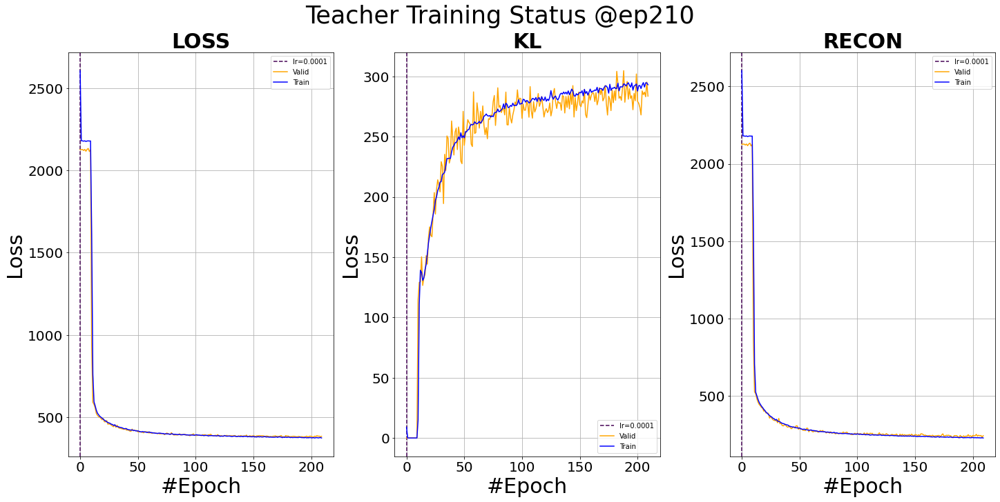

<Figure size 1440x720 with 0 Axes>

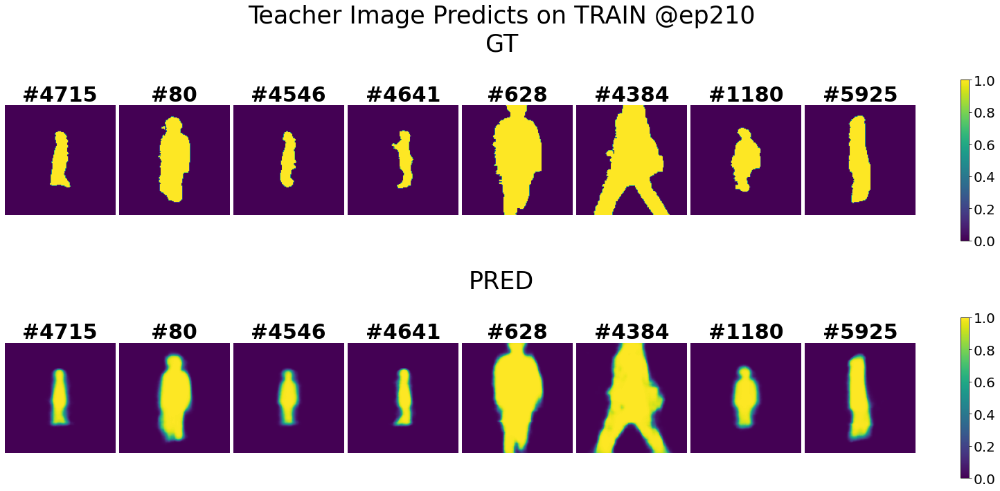

<Figure size 1440x720 with 0 Axes>

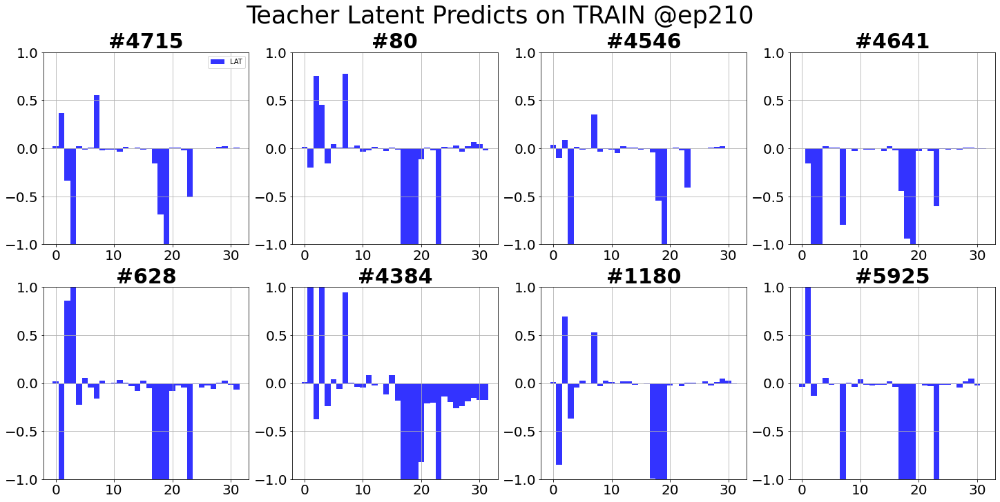

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 188.12830519676208 sec
Teacher test: sample=75/77, loss=291.9875    
Test finished. Average loss={'LOSS': 226.59375731821183, 'KL': 4.617378408645655, 'RECON': 224.2850680366739}

Total training time: 23.553550243377686 sec


<Figure size 1440x720 with 0 Axes>

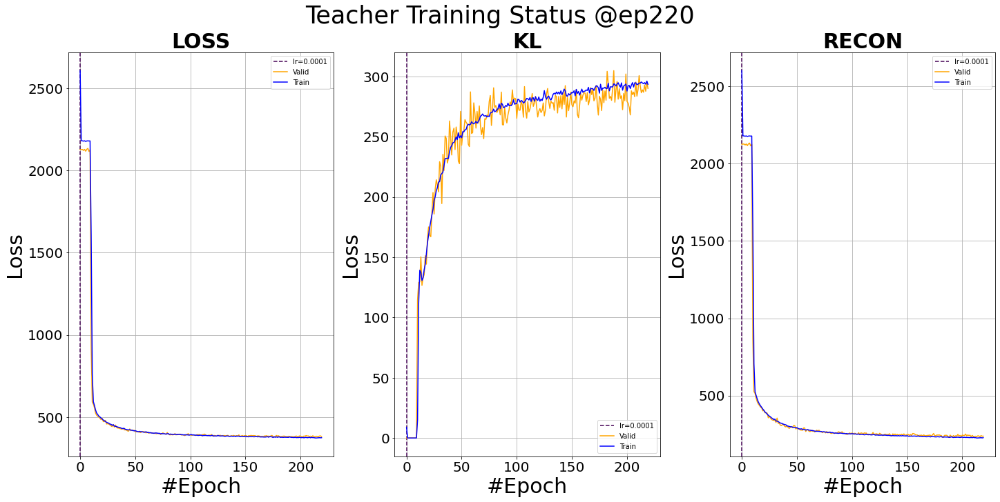

<Figure size 1440x720 with 0 Axes>

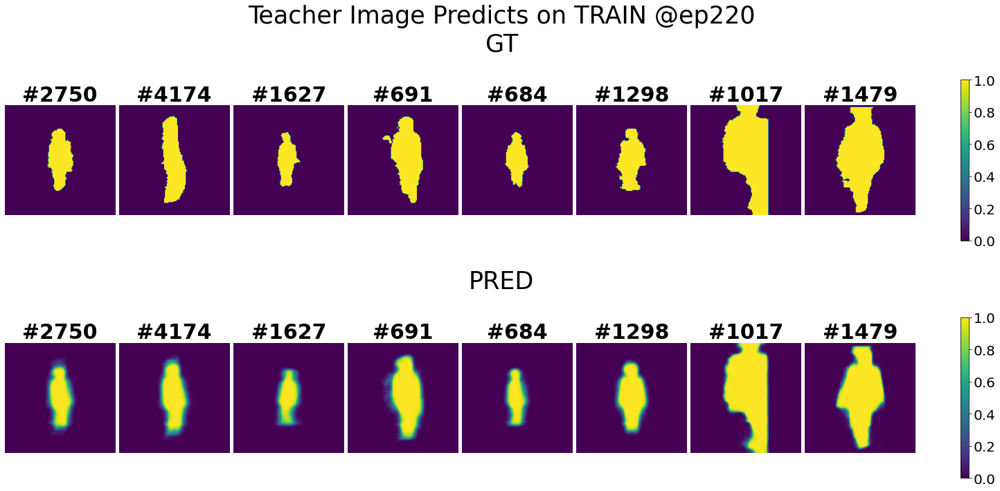

<Figure size 1440x720 with 0 Axes>

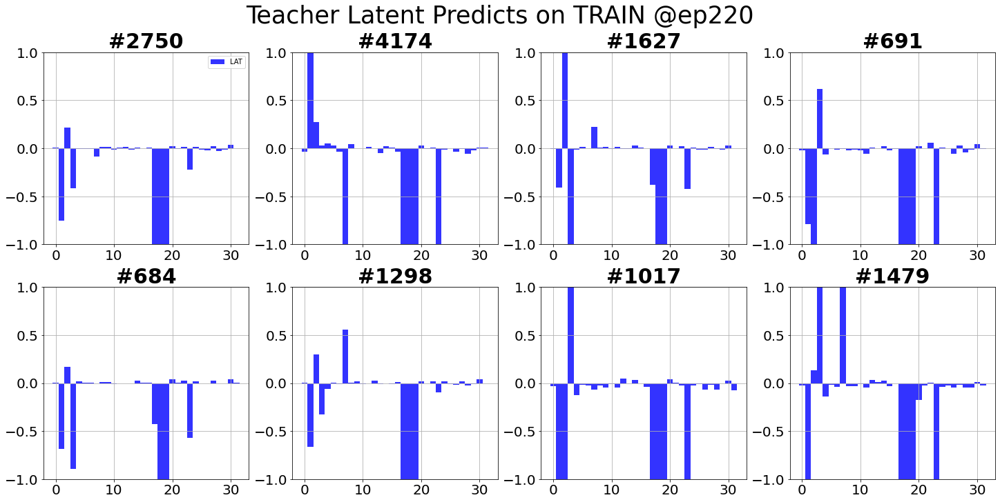

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 186.57356762886047 sec
Teacher test: sample=75/77, loss=173.6005    
Test finished. Average loss={'LOSS': 221.2814522284966, 'KL': 4.714702521680625, 'RECON': 218.92410093623323}

Total training time: 22.738198041915894 sec


<Figure size 1440x720 with 0 Axes>

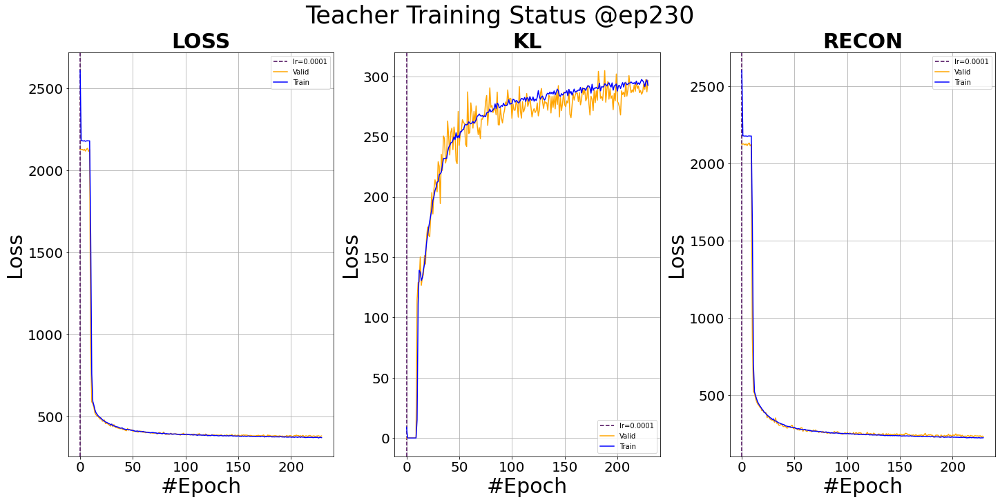

<Figure size 1440x720 with 0 Axes>

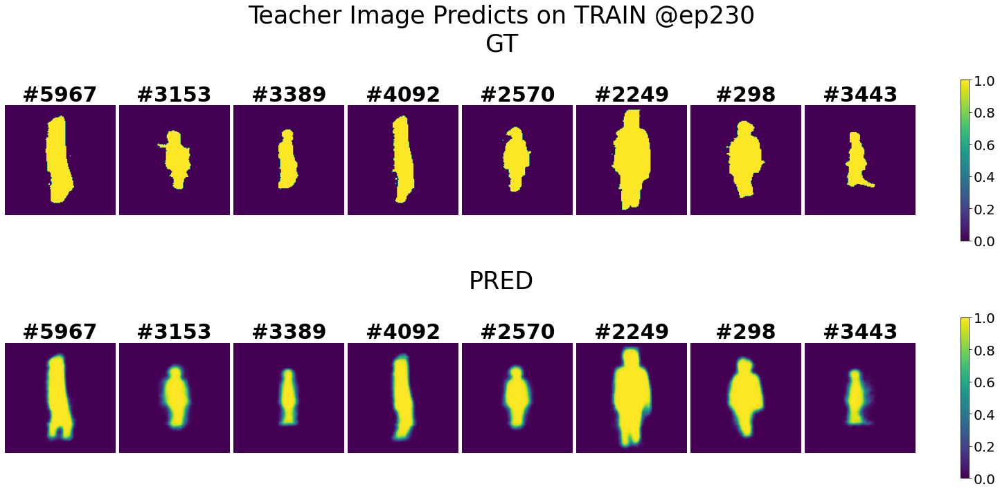

<Figure size 1440x720 with 0 Axes>

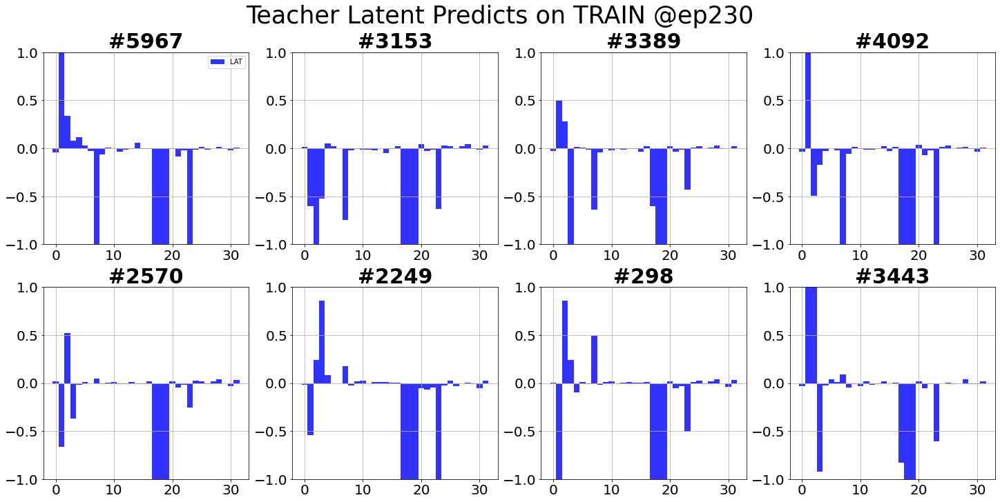

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 180.2463526725769 sec
Teacher test: sample=75/77, loss=251.9084    
Test finished. Average loss={'LOSS': 232.46081647005948, 'KL': 4.478023730508693, 'RECON': 230.22180453678232}

Total training time: 22.297697067260742 sec


<Figure size 1440x720 with 0 Axes>

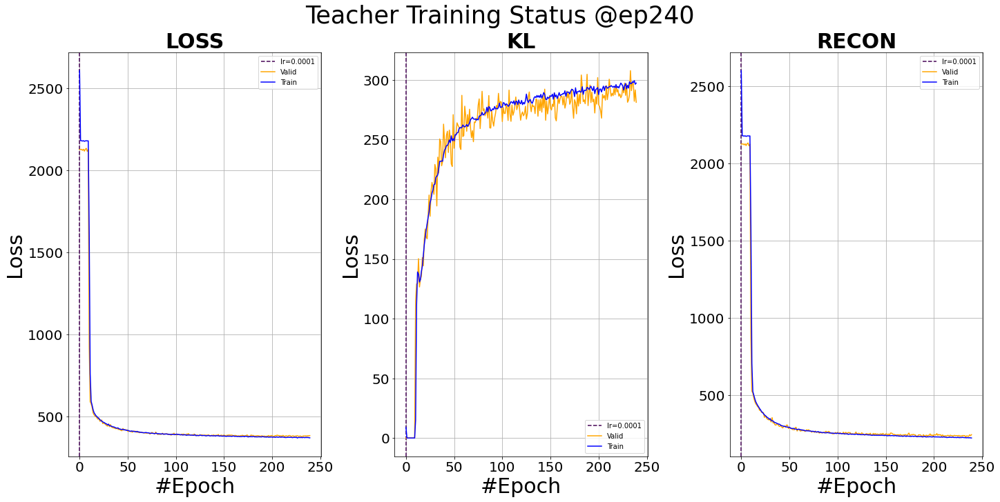

<Figure size 1440x720 with 0 Axes>

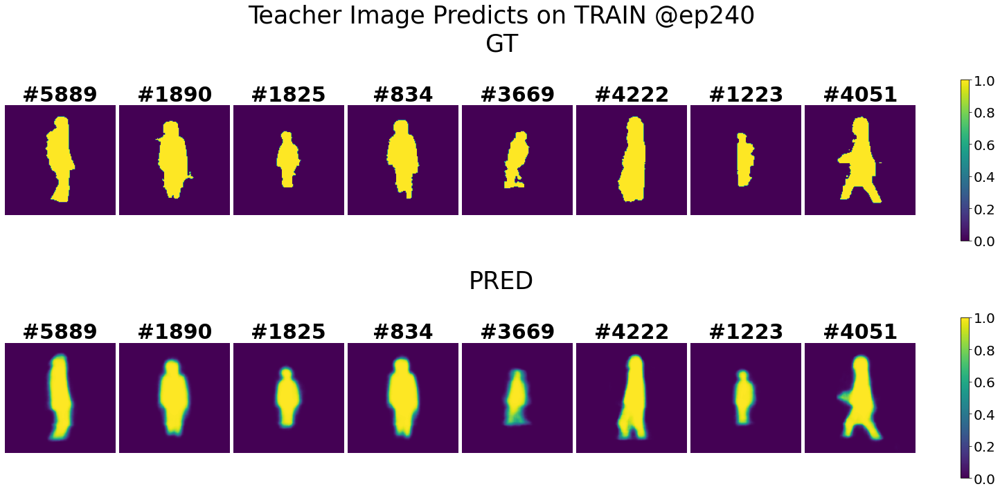

<Figure size 1440x720 with 0 Axes>

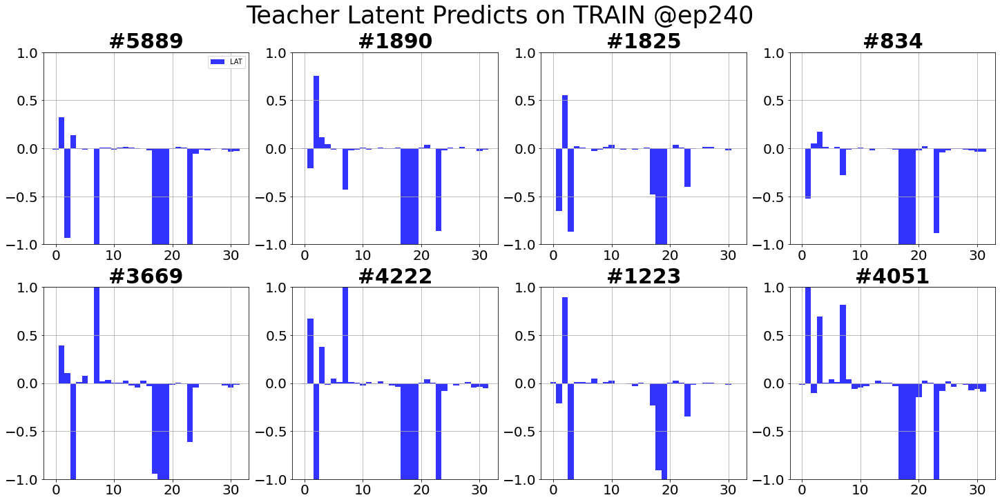

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 179.21082997322083 sec
Teacher test: sample=75/77, loss=103.8979    
Test finished. Average loss={'LOSS': 223.4614387781589, 'KL': 4.60896618458648, 'RECON': 221.15695568648252}

Total training time: 22.477784395217896 sec


<Figure size 1440x720 with 0 Axes>

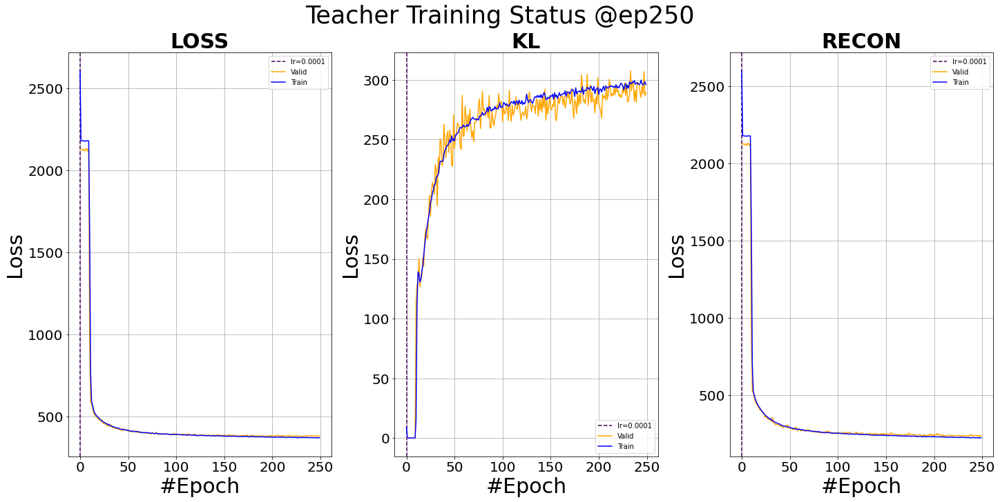

<Figure size 1440x720 with 0 Axes>

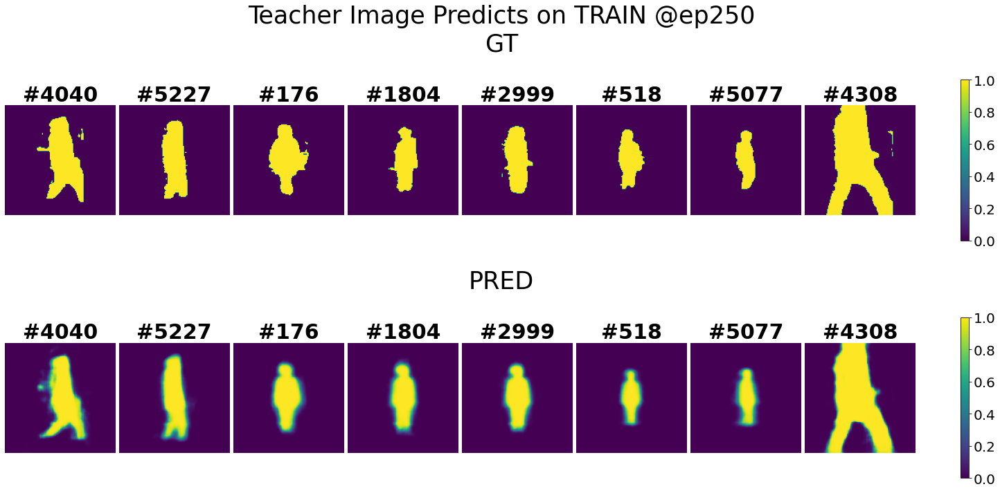

<Figure size 1440x720 with 0 Axes>

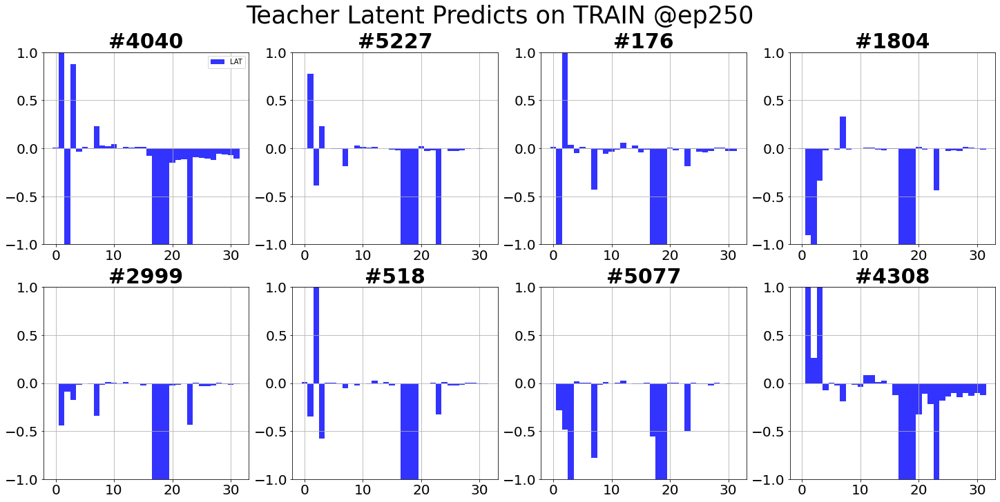

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 180.89543509483337 sec
Teacher test: sample=75/77, loss=204.1122    
Test finished. Average loss={'LOSS': 217.74796762868957, 'KL': 4.782507150446053, 'RECON': 215.35671407216554}

Total training time: 22.380478858947754 sec


<Figure size 1440x720 with 0 Axes>

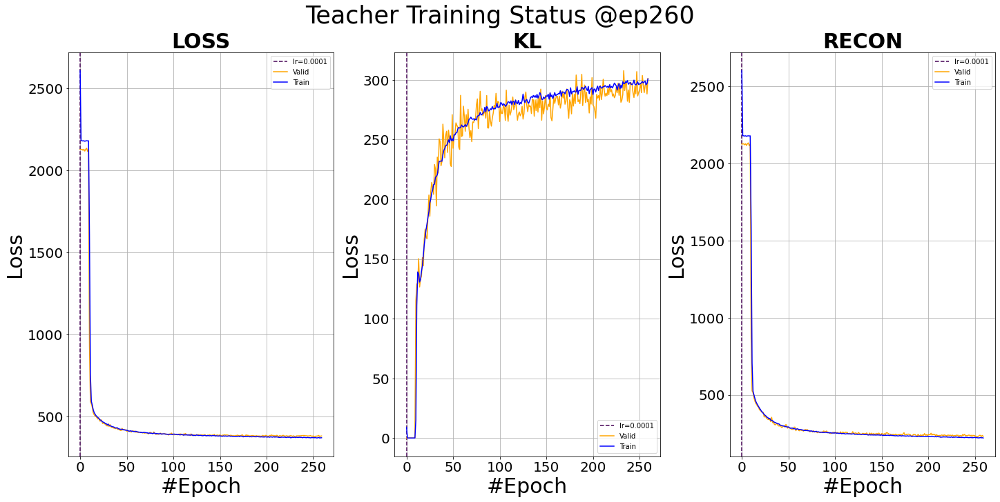

<Figure size 1440x720 with 0 Axes>

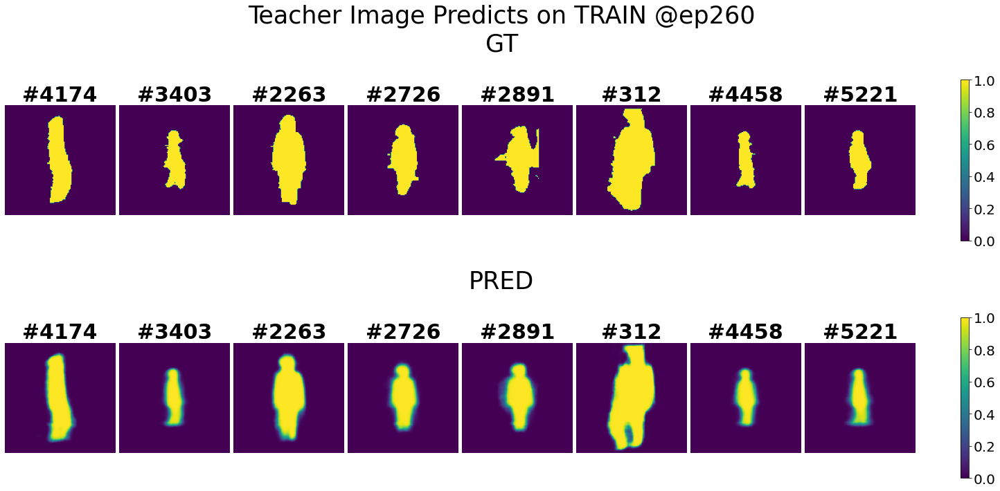

<Figure size 1440x720 with 0 Axes>

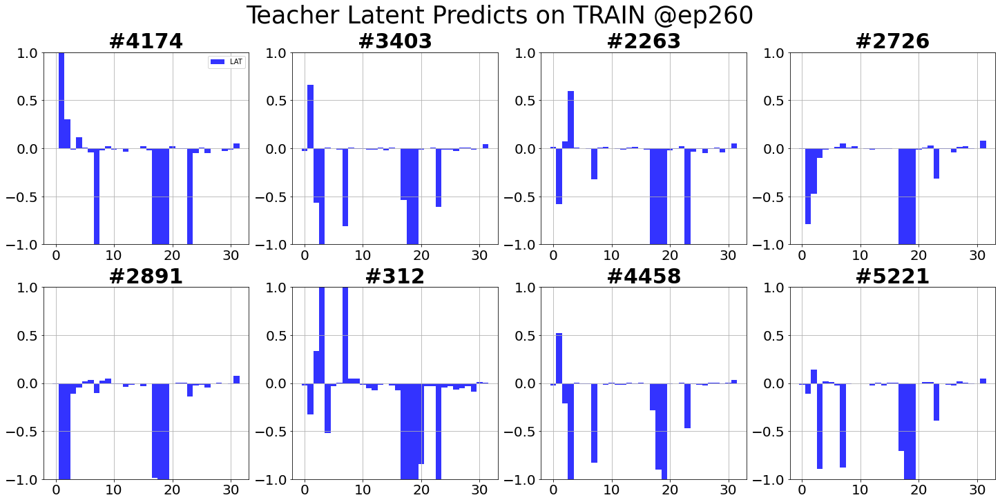

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 179.28261351585388 sec
Teacher test: sample=75/77, loss=295.6461    
Test finished. Average loss={'LOSS': 227.85850018185454, 'KL': 4.546145625509225, 'RECON': 225.5854273477158}

Total training time: 22.446396589279175 sec


<Figure size 1440x720 with 0 Axes>

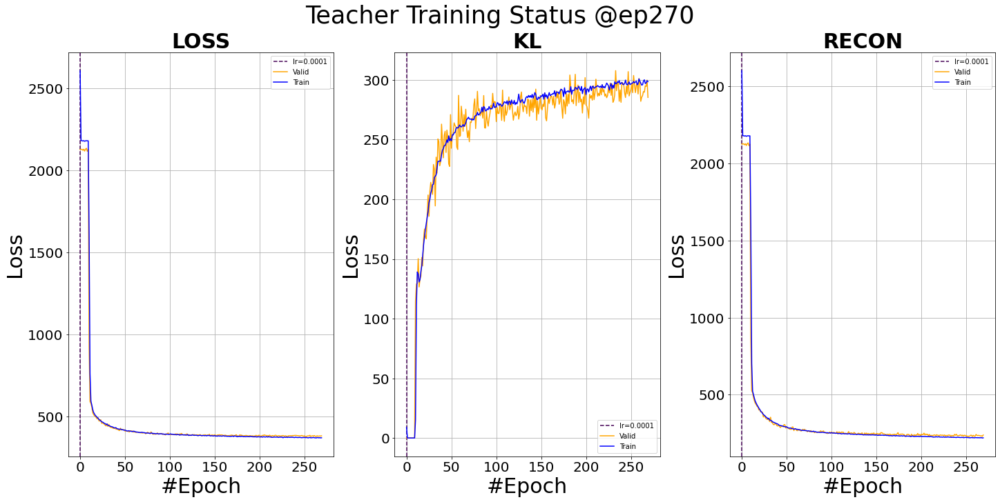

<Figure size 1440x720 with 0 Axes>

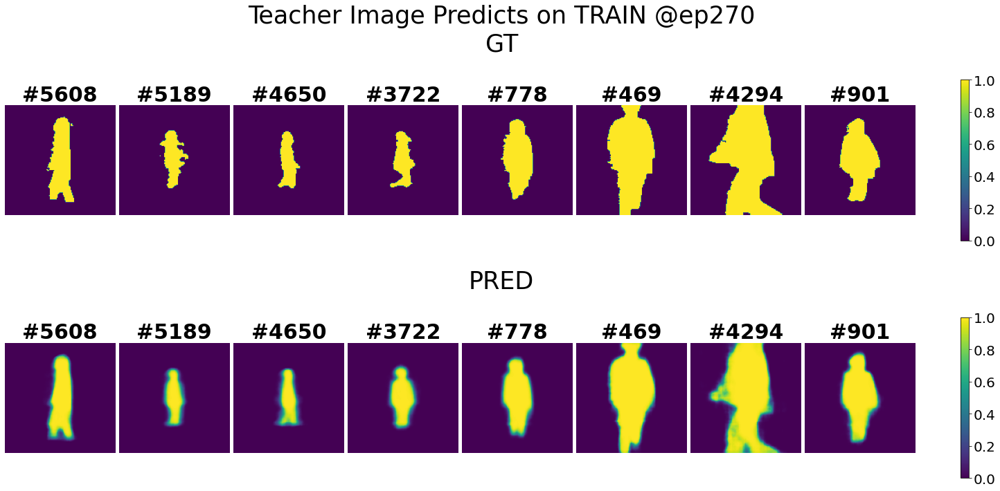

<Figure size 1440x720 with 0 Axes>

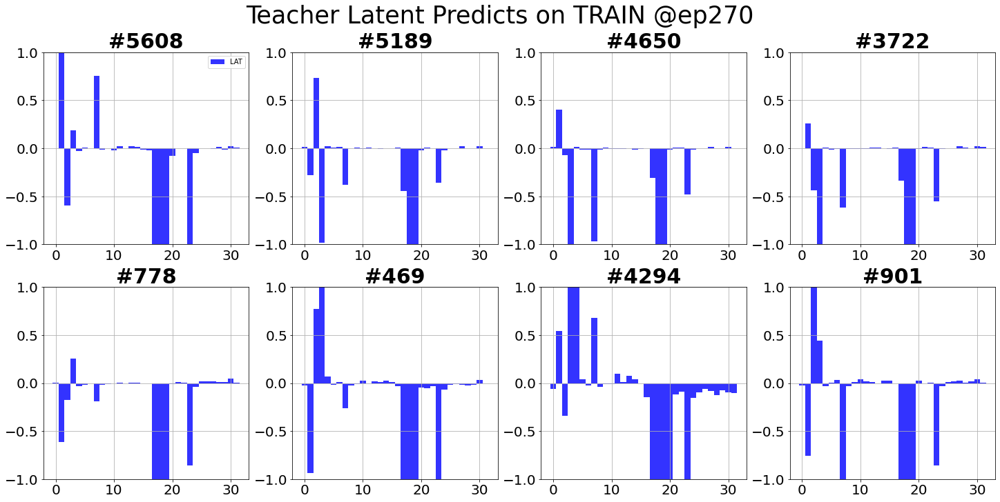

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 179.84563755989075 sec
Teacher test: sample=75/77, loss=186.5053    
Test finished. Average loss={'LOSS': 219.13158873768595, 'KL': 4.690392536534504, 'RECON': 216.78639246116984}

Total training time: 22.646299600601196 sec


<Figure size 1440x720 with 0 Axes>

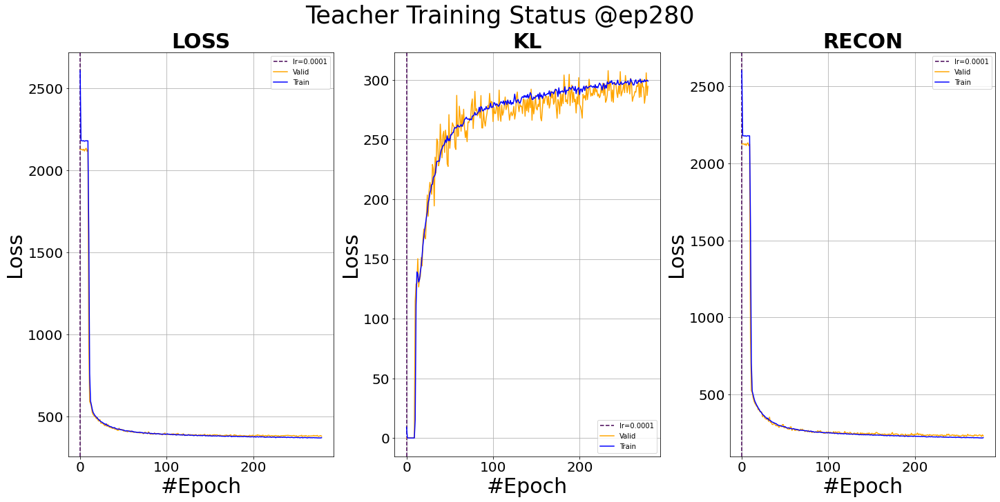

<Figure size 1440x720 with 0 Axes>

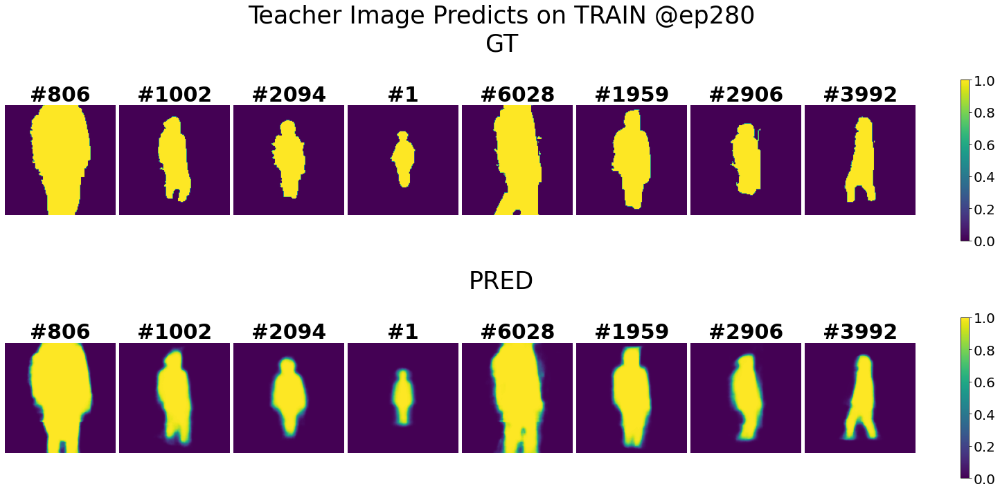

<Figure size 1440x720 with 0 Axes>

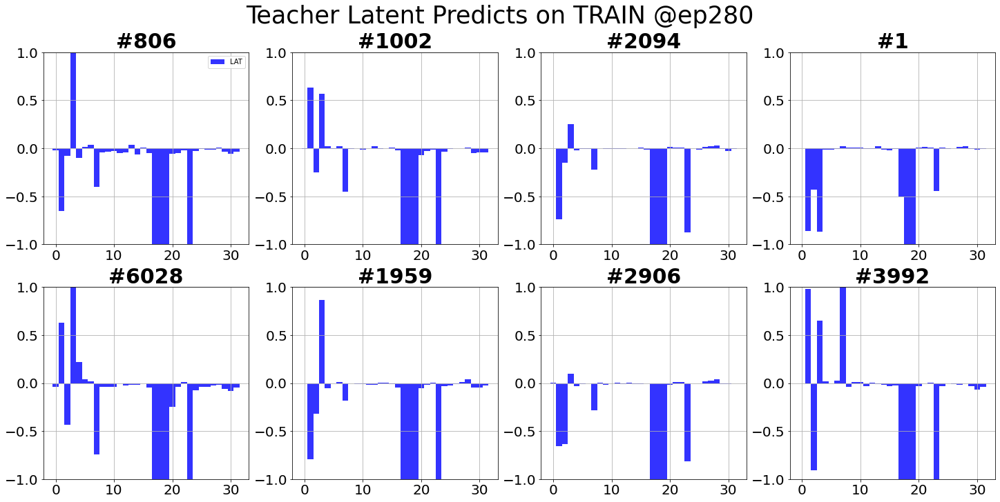

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 180.09395289421082 sec
Teacher test: sample=75/77, loss=166.7806    
Test finished. Average loss={'LOSS': 218.5763218031301, 'KL': 4.674075067478728, 'RECON': 216.23928425528786}

Total training time: 22.025557279586792 sec


<Figure size 1440x720 with 0 Axes>

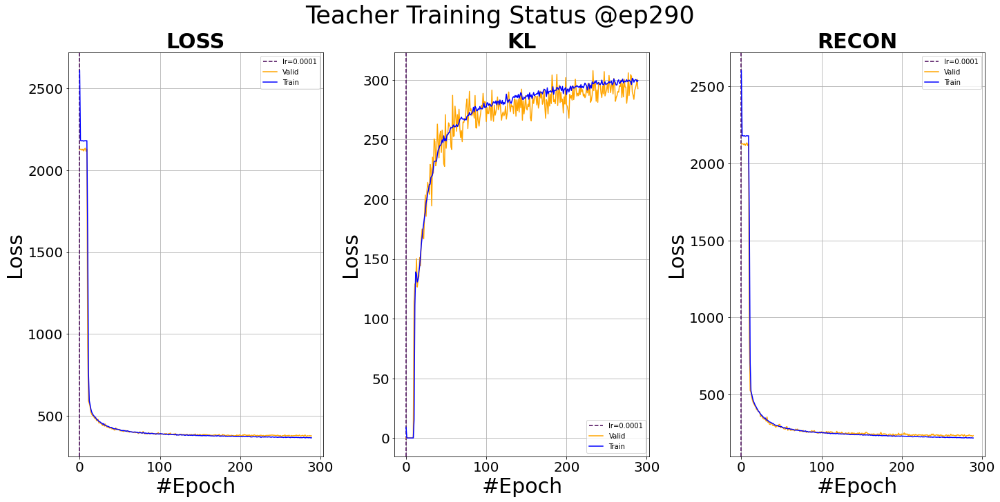

<Figure size 1440x720 with 0 Axes>

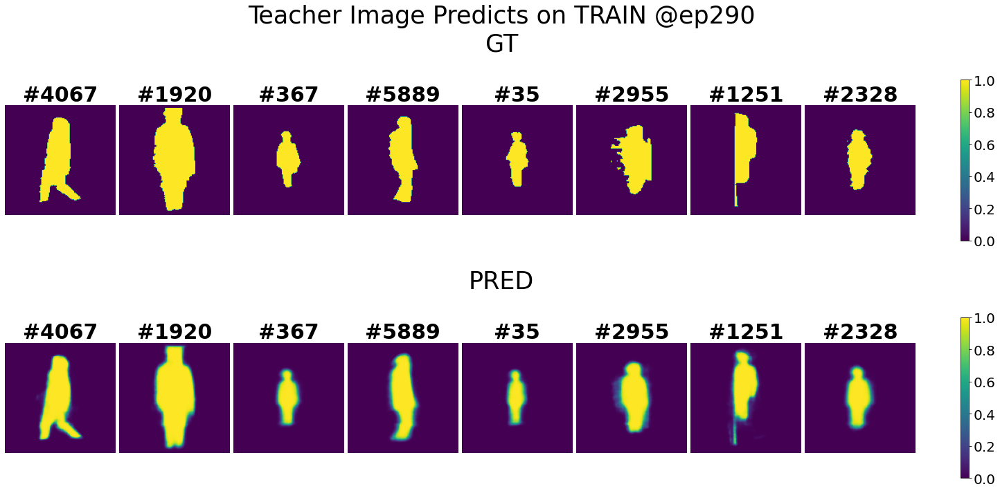

<Figure size 1440x720 with 0 Axes>

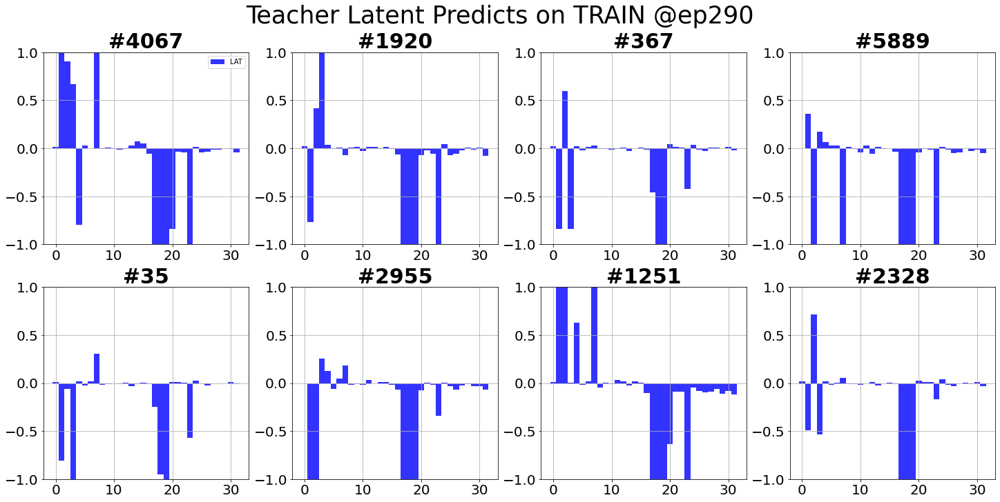

Teacher valid: epoch=9/10, batch=15/19, current best valid loss=326.3669        26.3669    
Total training time: 179.57101464271545 sec
Teacher test: sample=75/77, loss=255.5477    
Test finished. Average loss={'LOSS': 215.26711134012643, 'KL': 4.669215018655379, 'RECON': 212.93250372967162}

Total training time: 22.45365285873413 sec


<Figure size 1440x720 with 0 Axes>

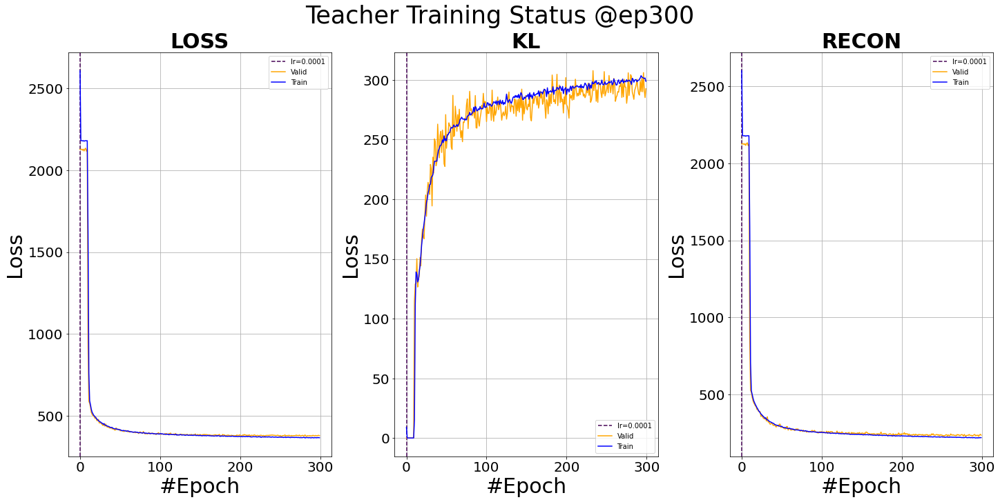

<Figure size 1440x720 with 0 Axes>

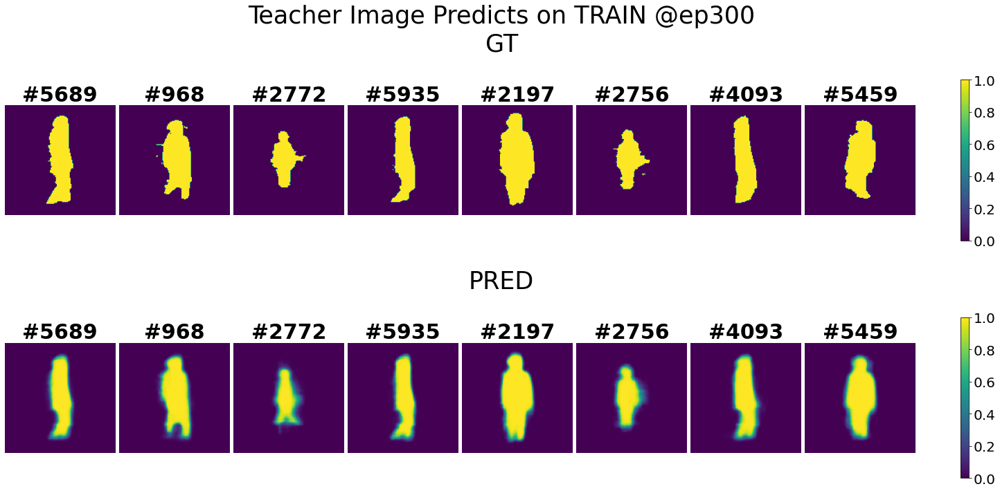

<Figure size 1440x720 with 0 Axes>

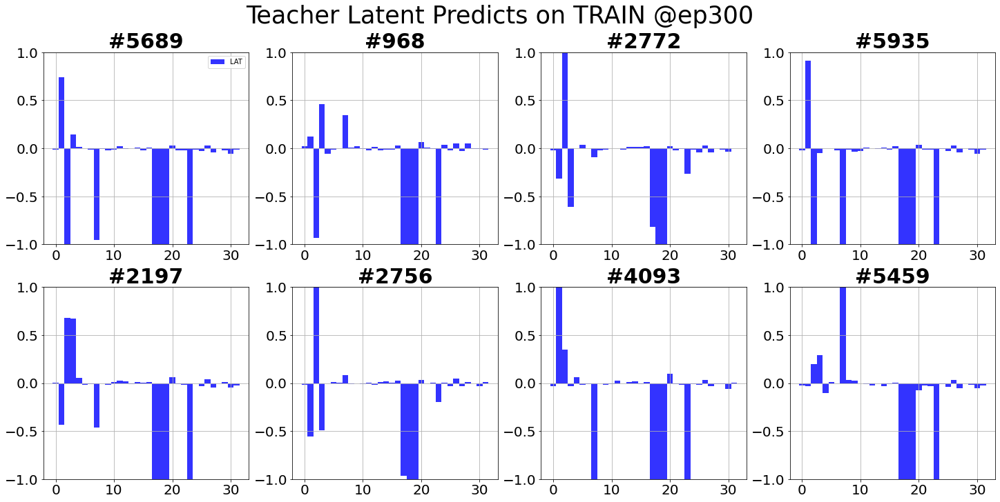


Schedule Completed!


In [43]:
### Scheduler
%matplotlib inline
#trainer1.lr=1e-5
T_trainer.scheduler(turns=10,
                  test_loader='train', select_num=8,
                  autosave=True, notion=f"{date}_{run}", save_model=False)

/home/bob/.local/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py:172: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)
  return collate([torch.as_tensor(b) for b in batch], collate_fn_map=collate_fn_map)
/home/bob/.local/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py:172: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest 

Teacher test: sample=925/930, loss=162.9799    
Test finished. Average loss={'LOSS': 233.48966680547244, 'KL': 4.062575322069147, 'RECON': 231.4583791589224}

Total training time: 9.082538604736328 sec


<Figure size 1440x720 with 0 Axes>

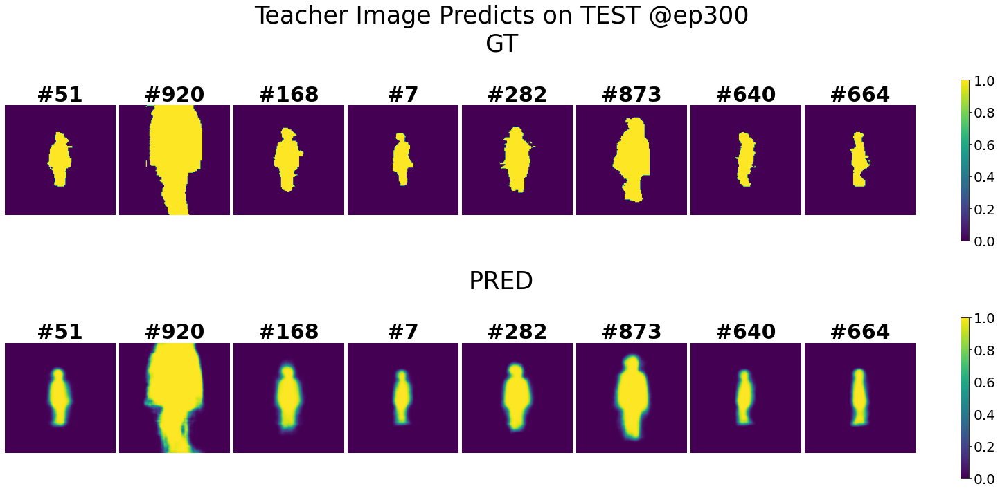

<Figure size 1440x720 with 0 Axes>

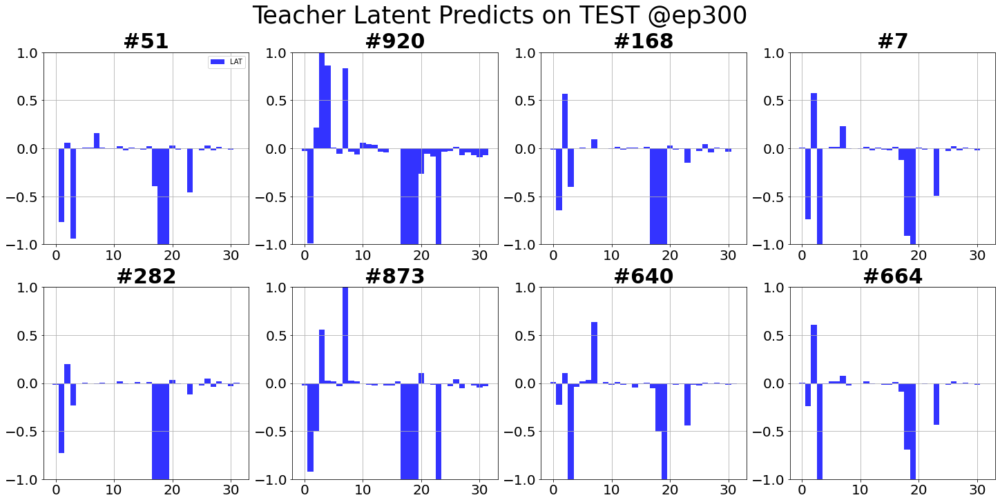

In [44]:
T_trainer.test(loader='test')
T_trainer.plot_test(select_num=8, autosave=True, notion=f"{date}_{run}")

In [45]:
T_trainer.save(f"{date}_{run}")

Saving models...
Saving imgen...
Saving imgde...
All saved!


### Student

#### Train

In [5]:
torch.cuda.set_device(gpu)
csiencoder = TP.CSIEncoder(lstm_steps=225)
centerdecoder = TP.CenterDecoder()
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)
imgencoder.load_state_dict(torch.load(f"../saved/240425_{run}/240425_{run}_Teacher_IMGENV07C1@ep300.pth"))
imgdecoder.load_state_dict(torch.load(f"../saved/240425_{run}/240425_{run}_Teacher_IMGDEV07C1@ep300.pth"))

S_trainer = TP.StudentTrainer(
                              name='Student', mask=True,
    networks=[csiencoder, centerdecoder, imgencoder, imgdecoder],
#    networks=[csiencoder, bbxdecoder, T_trainer.models['imgen'], T_trainer.models['imgde']],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1319.365169286728 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.1278    
Test finished. Average loss={'LOSS': 0.0715916042372319, 'MU': 0.07347846392774529, 'LOGVAR': 0.05063427314958771, 'CTR': 6.24810471445131e-06, 'DPT': 2.05716672139456e-06, 'IMG': 0.026280669905373814}

Total training time: 91.23200011253357 sec


<Figure size 432x288 with 0 Axes>

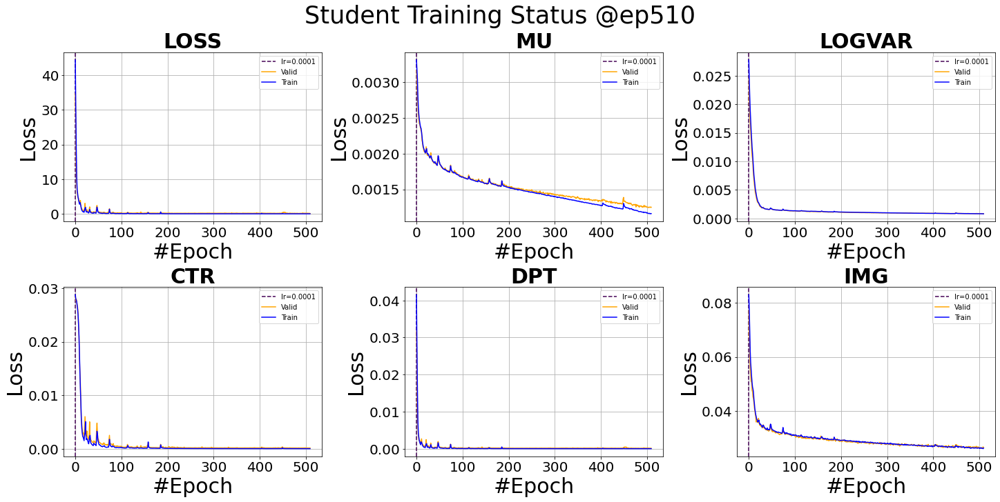

<Figure size 1440x720 with 0 Axes>

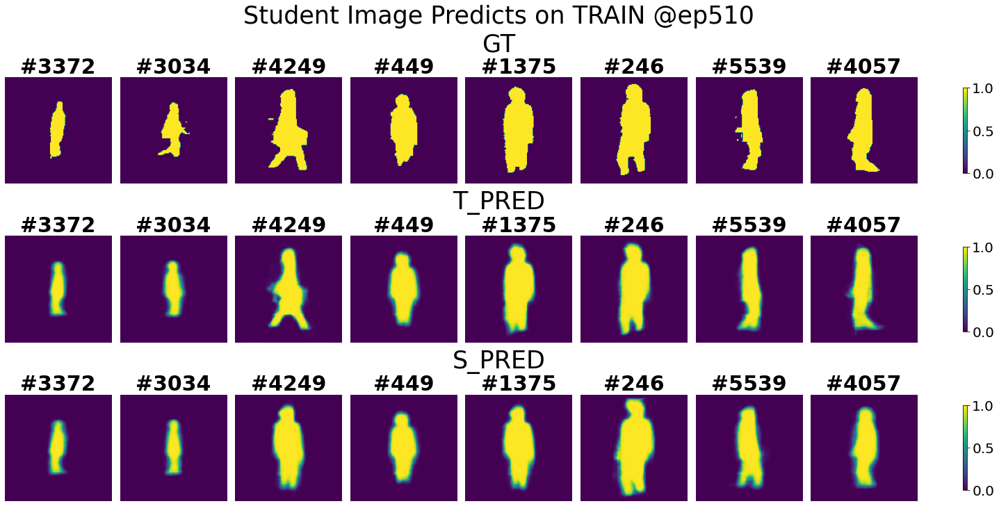

<Figure size 1440x720 with 0 Axes>

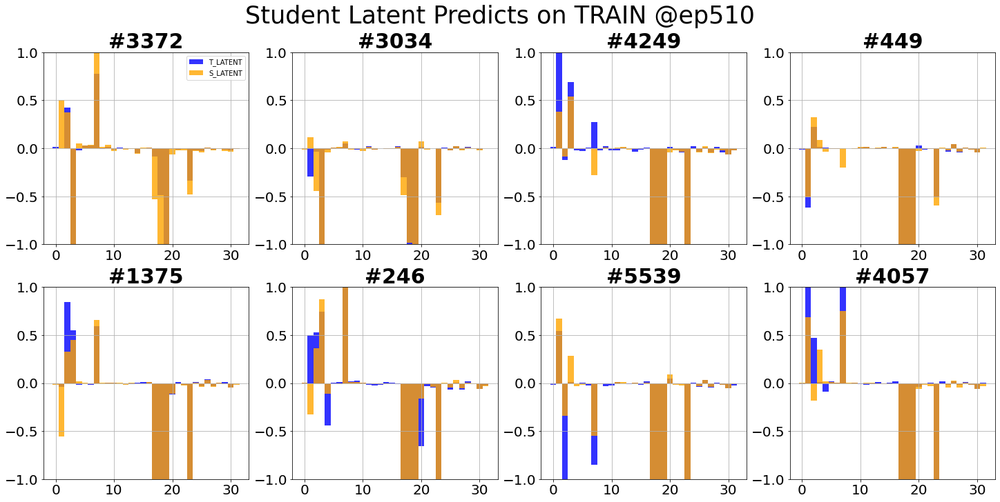

<Figure size 1440x720 with 0 Axes>

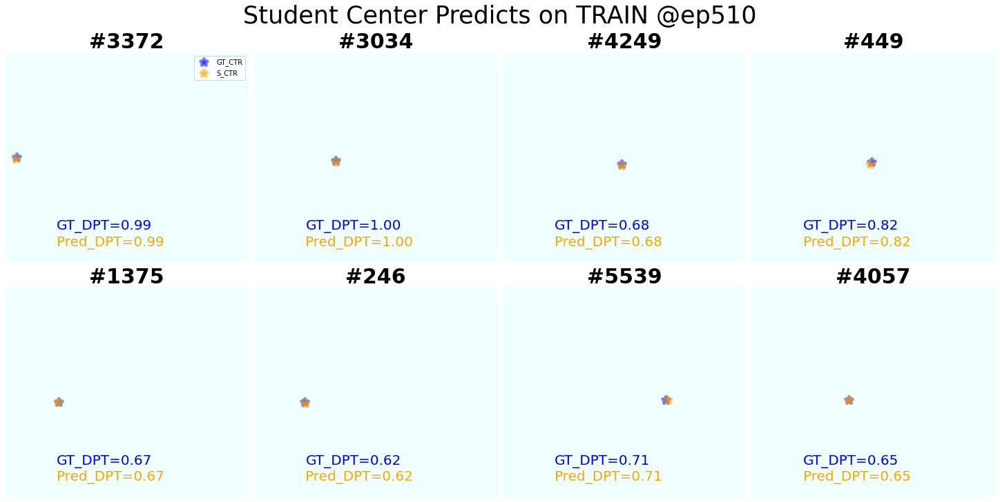

<Figure size 1440x720 with 0 Axes>

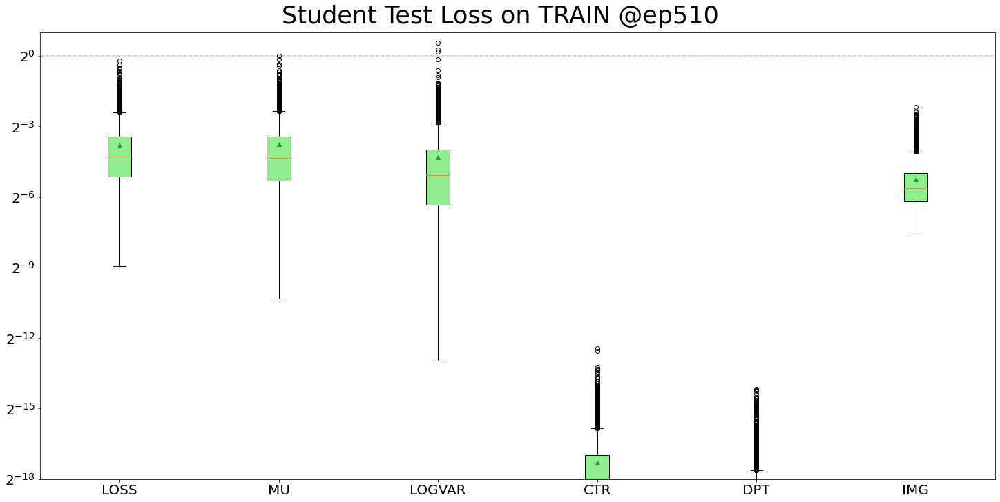

<Figure size 1440x720 with 0 Axes>

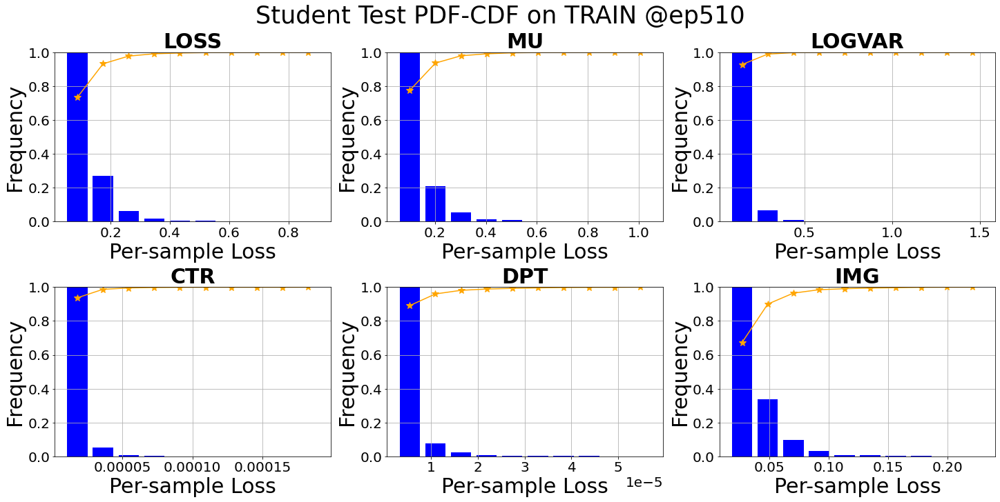

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1297.7974882125854 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.1632    
Test finished. Average loss={'LOSS': 0.07134489731309601, 'MU': 0.07240587549861263, 'LOGVAR': 0.05023087701287496, 'CTR': 8.405854652209863e-06, 'DPT': 2.533434877987967e-06, 'IMG': 0.026103549525682217}

Total training time: 91.42164039611816 sec


<Figure size 1440x720 with 0 Axes>

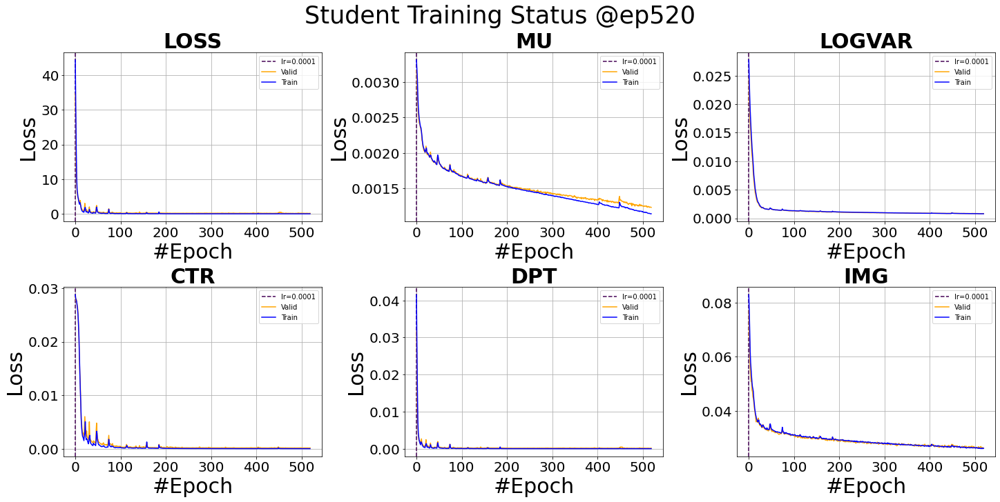

<Figure size 1440x720 with 0 Axes>

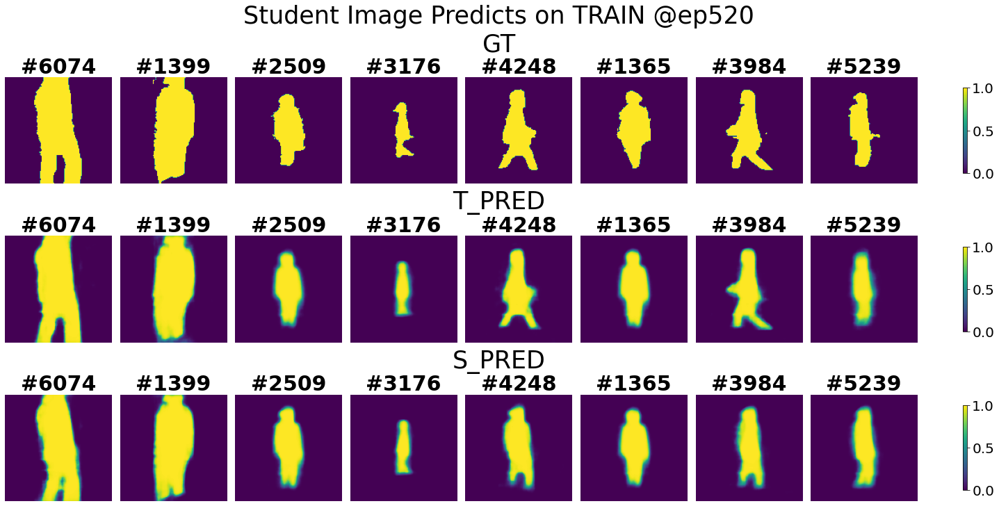

<Figure size 1440x720 with 0 Axes>

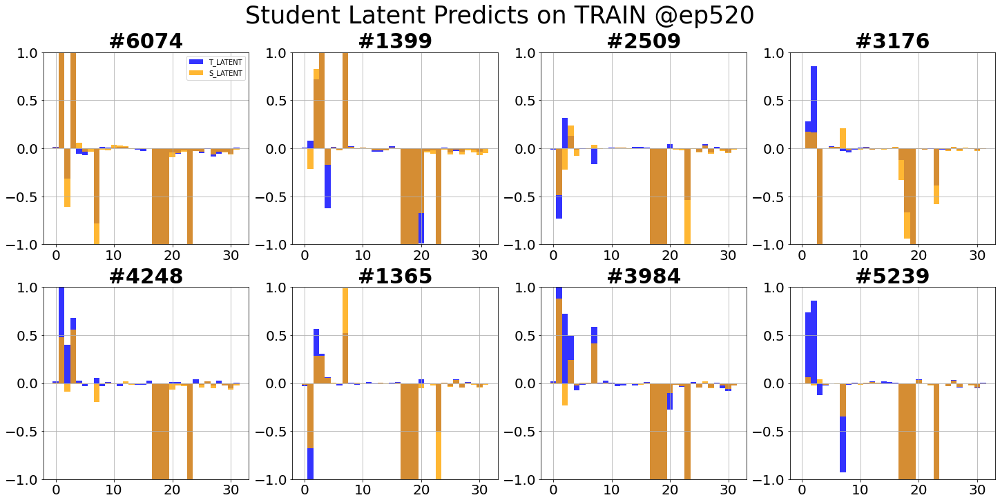

<Figure size 1440x720 with 0 Axes>

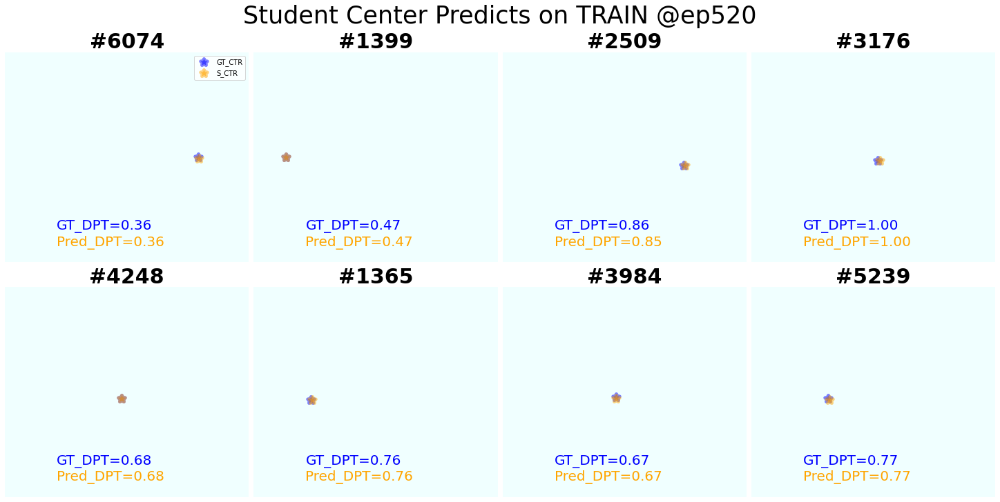

<Figure size 1440x720 with 0 Axes>

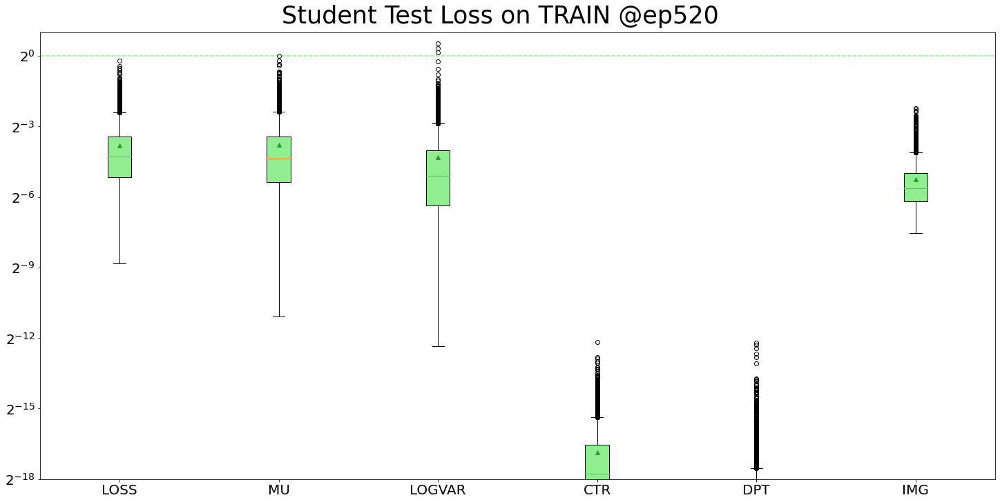

<Figure size 1440x720 with 0 Axes>

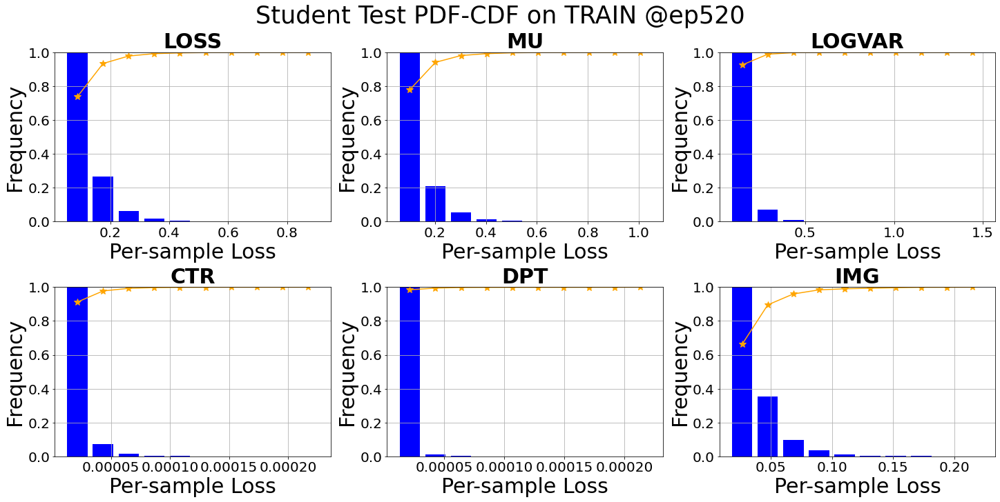

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1296.1254043579102 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.0715    
Test finished. Average loss={'LOSS': 0.06979249682633774, 'MU': 0.07146750142699414, 'LOGVAR': 0.049678179479967666, 'CTR': 6.449316104628495e-06, 'DPT': 2.037927061742856e-06, 'IMG': 0.026081994252922708}

Total training time: 90.90269064903259 sec


<Figure size 1440x720 with 0 Axes>

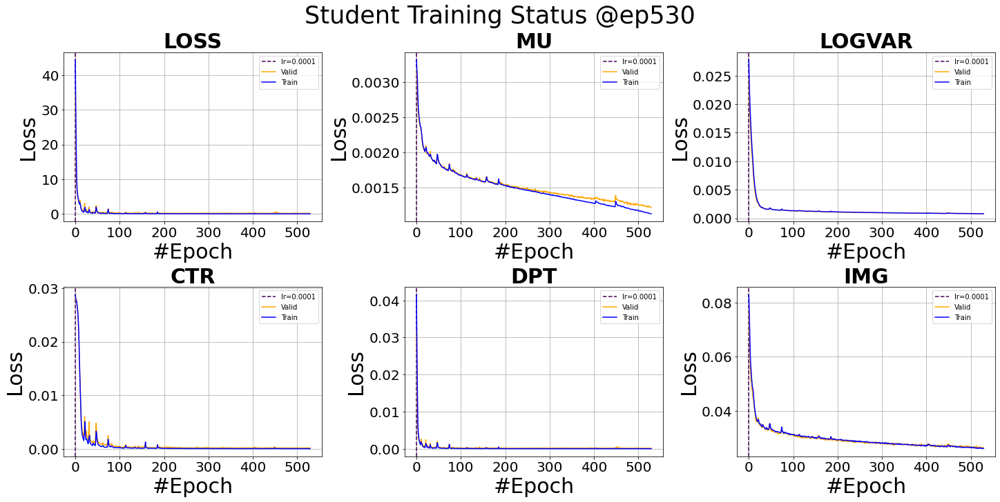

<Figure size 1440x720 with 0 Axes>

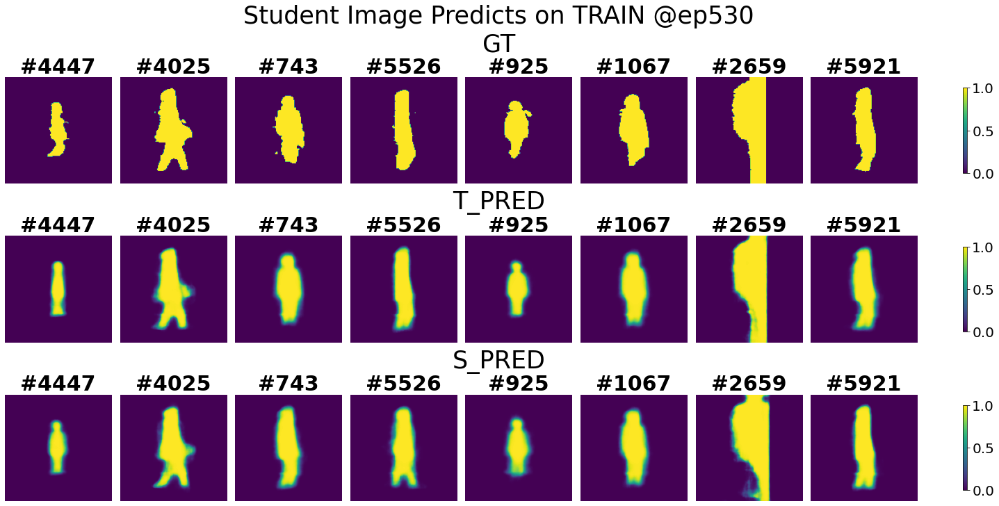

<Figure size 1440x720 with 0 Axes>

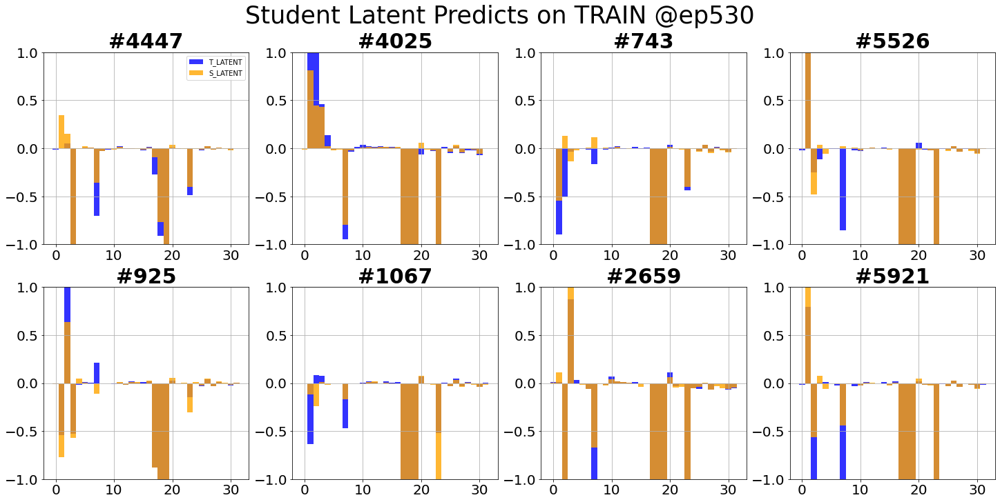

<Figure size 1440x720 with 0 Axes>

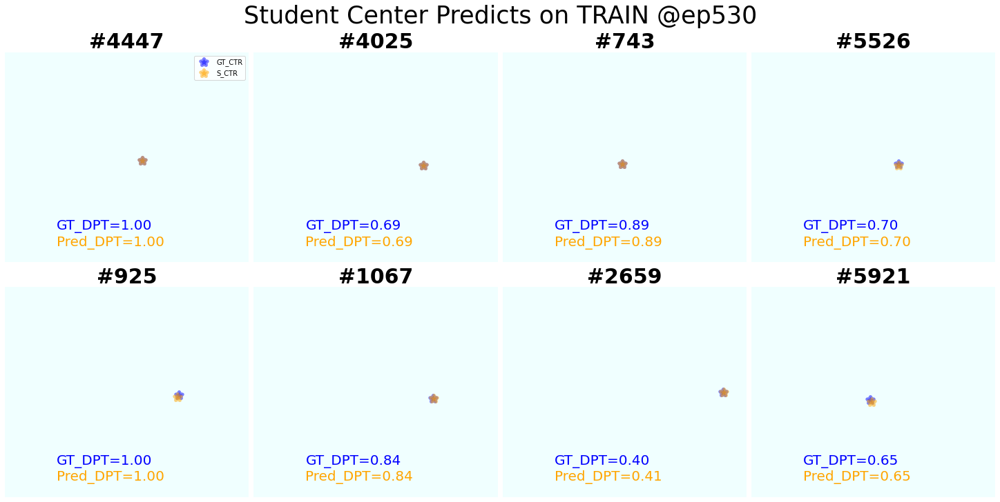

<Figure size 1440x720 with 0 Axes>

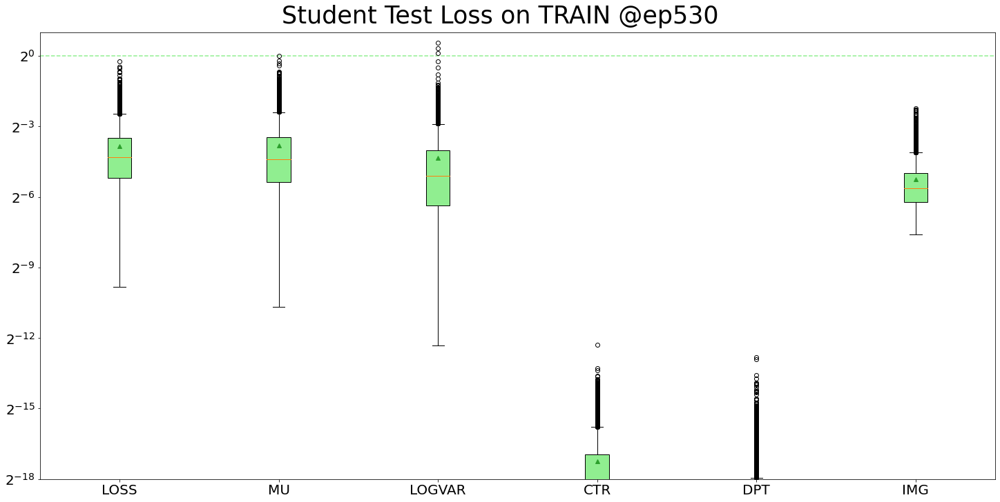

<Figure size 1440x720 with 0 Axes>

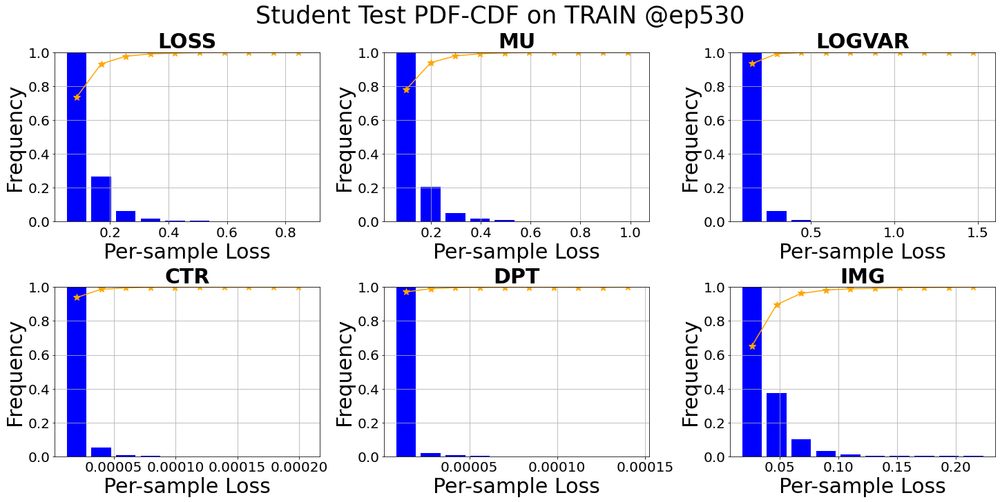

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1295.1217501163483 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.1906    
Test finished. Average loss={'LOSS': 0.06956467903690683, 'MU': 0.07030379813532853, 'LOGVAR': 0.04926863638671752, 'CTR': 7.800762125431034e-06, 'DPT': 2.687835900765948e-06, 'IMG': 0.025903253155751396}

Total training time: 91.86521530151367 sec


<Figure size 1440x720 with 0 Axes>

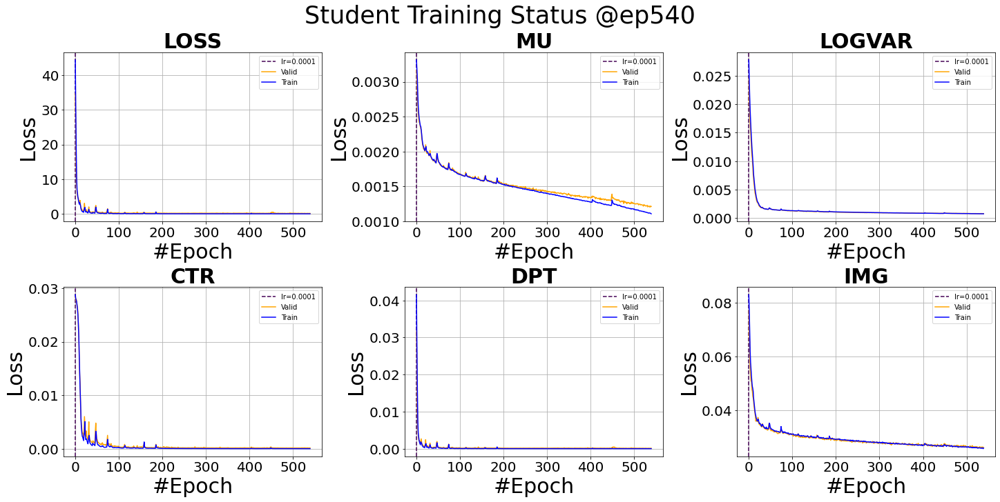

<Figure size 1440x720 with 0 Axes>

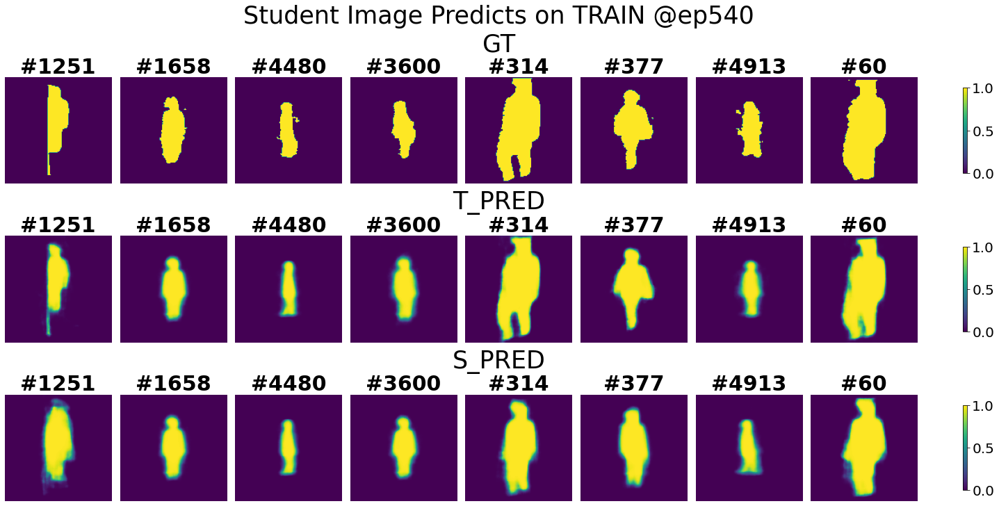

<Figure size 1440x720 with 0 Axes>

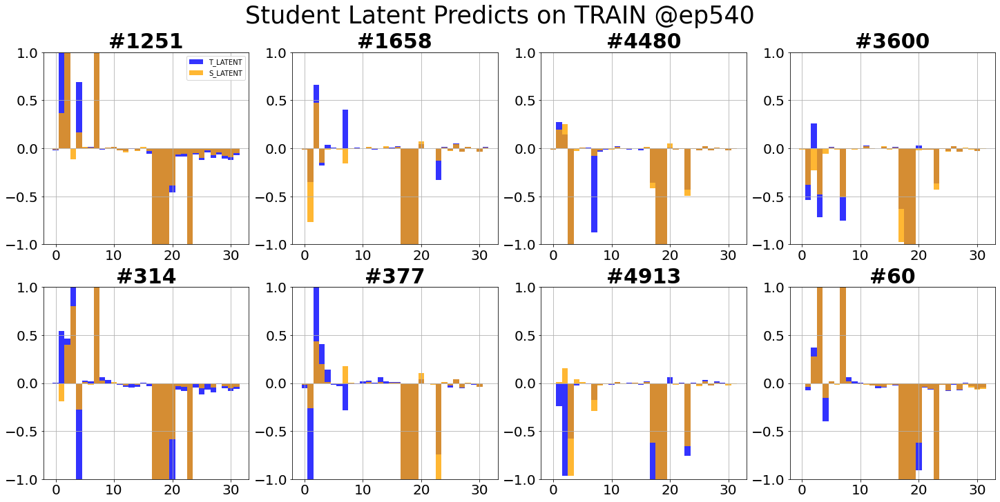

<Figure size 1440x720 with 0 Axes>

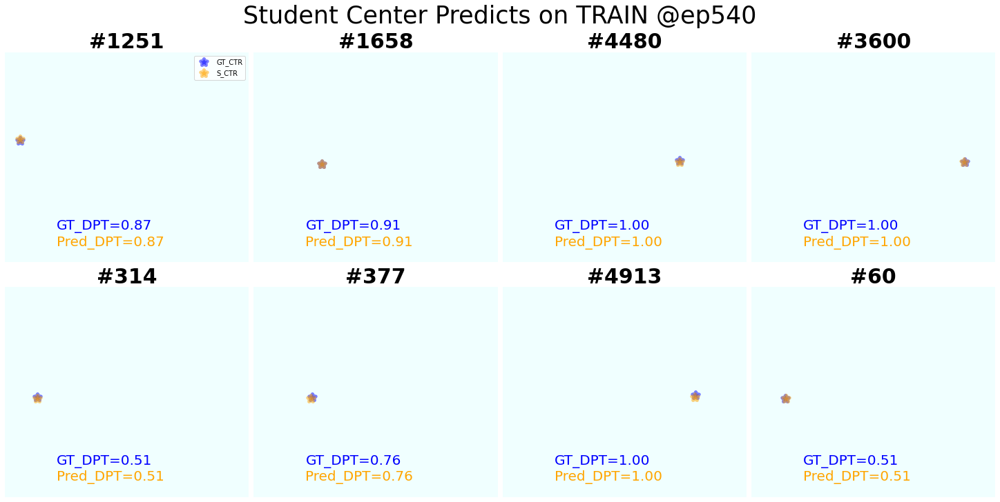

<Figure size 1440x720 with 0 Axes>

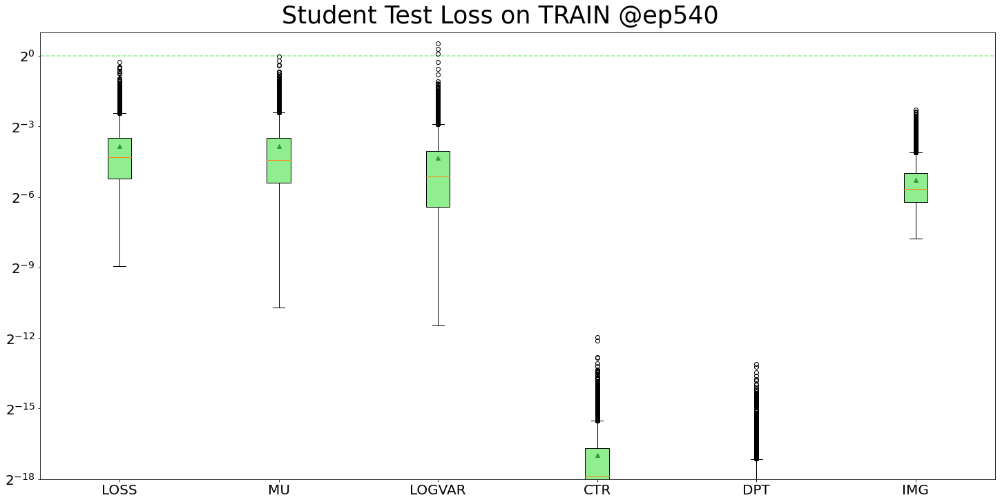

<Figure size 1440x720 with 0 Axes>

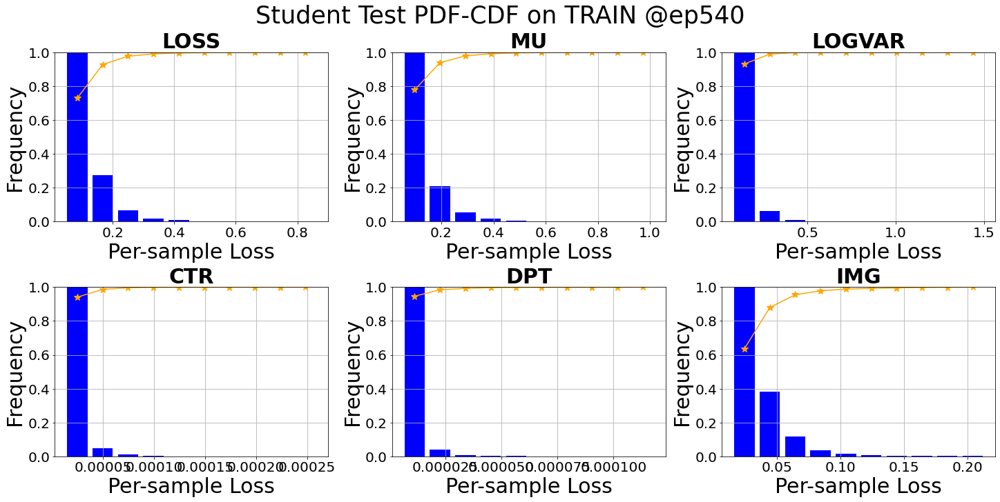

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1297.4082248210907 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.0066    
Test finished. Average loss={'LOSS': 0.06722136198108533, 'MU': 0.06932435373391263, 'LOGVAR': 0.04842329171838055, 'CTR': 5.5765558061549e-06, 'DPT': 1.5195638535278719e-06, 'IMG': 0.025805180360352946}

Total training time: 91.63741397857666 sec


<Figure size 1440x720 with 0 Axes>

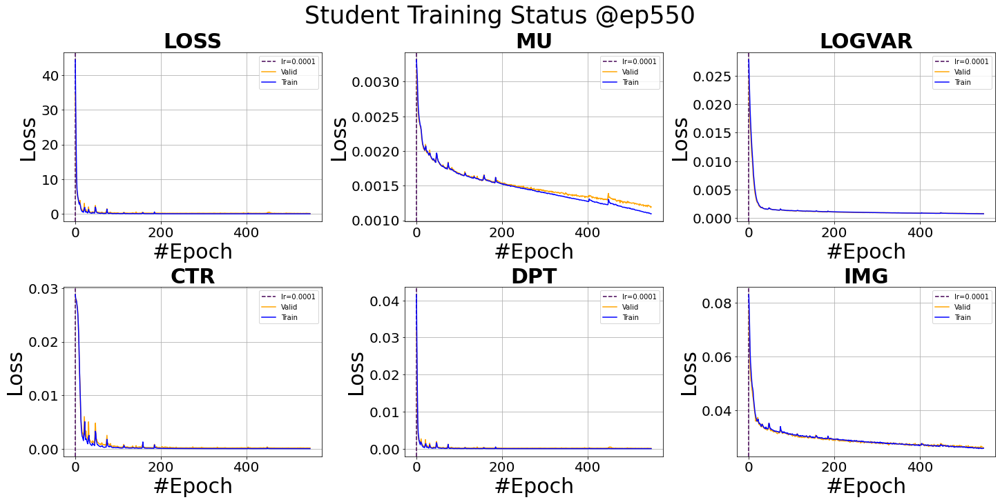

<Figure size 1440x720 with 0 Axes>

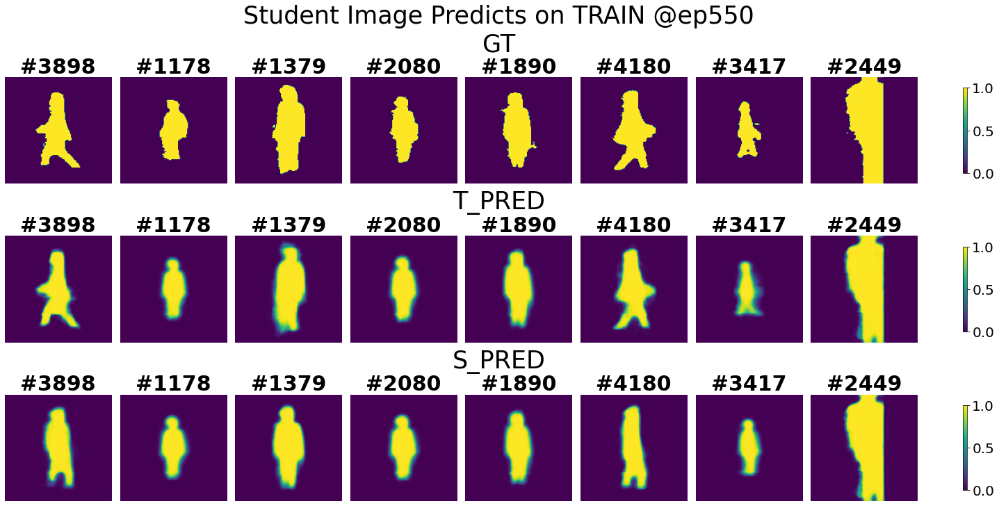

<Figure size 1440x720 with 0 Axes>

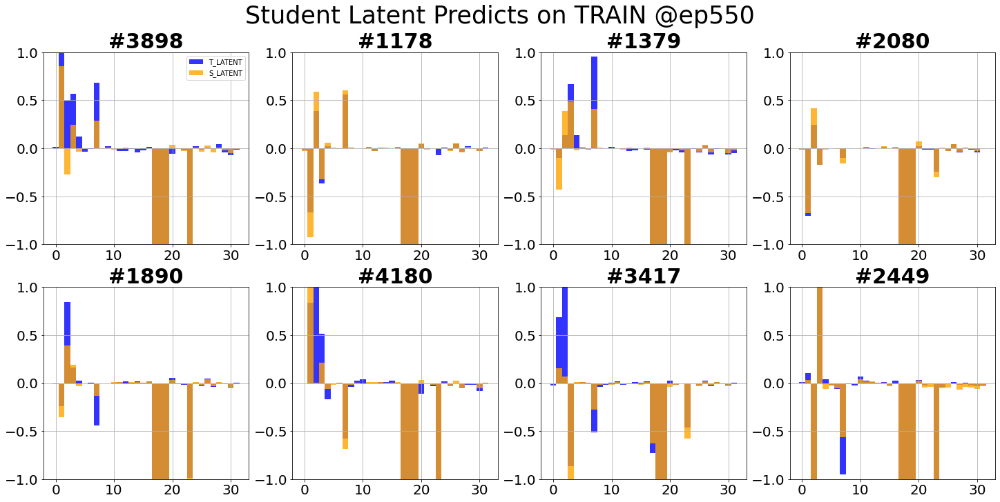

<Figure size 1440x720 with 0 Axes>

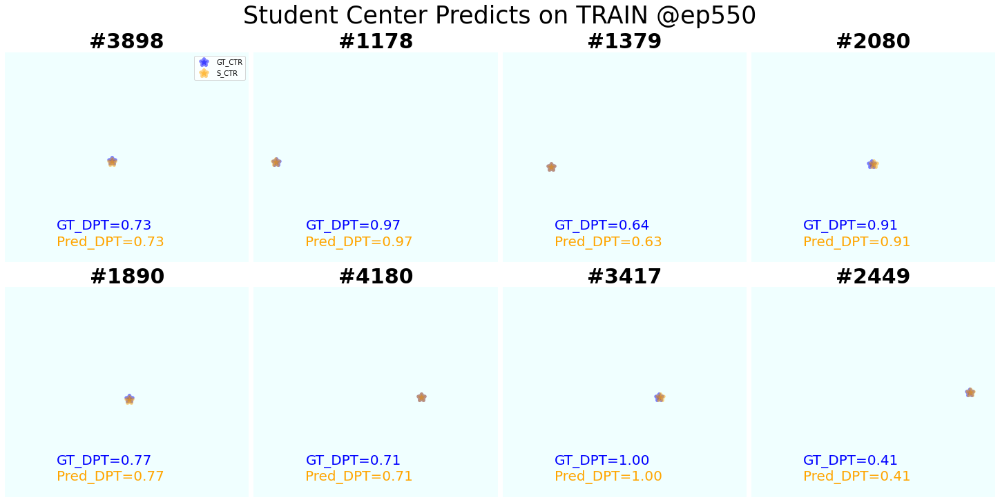

<Figure size 1440x720 with 0 Axes>

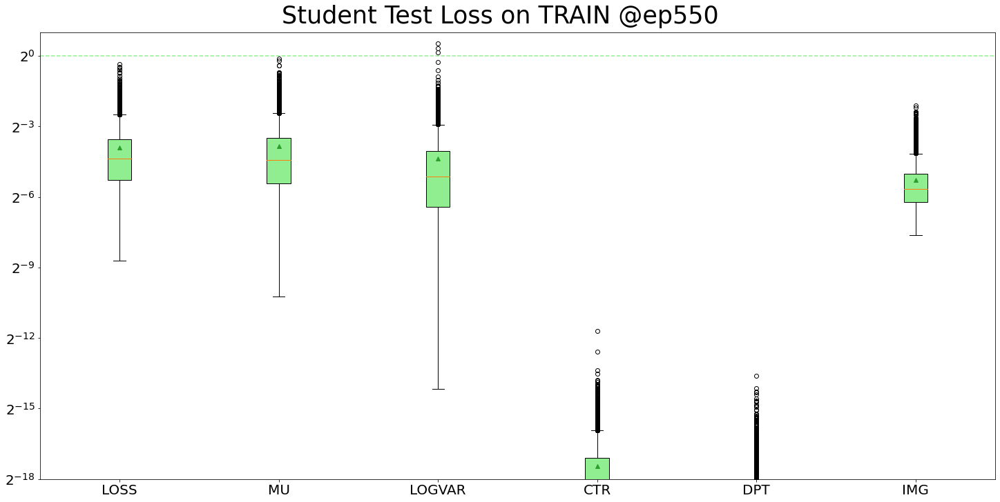

<Figure size 1440x720 with 0 Axes>

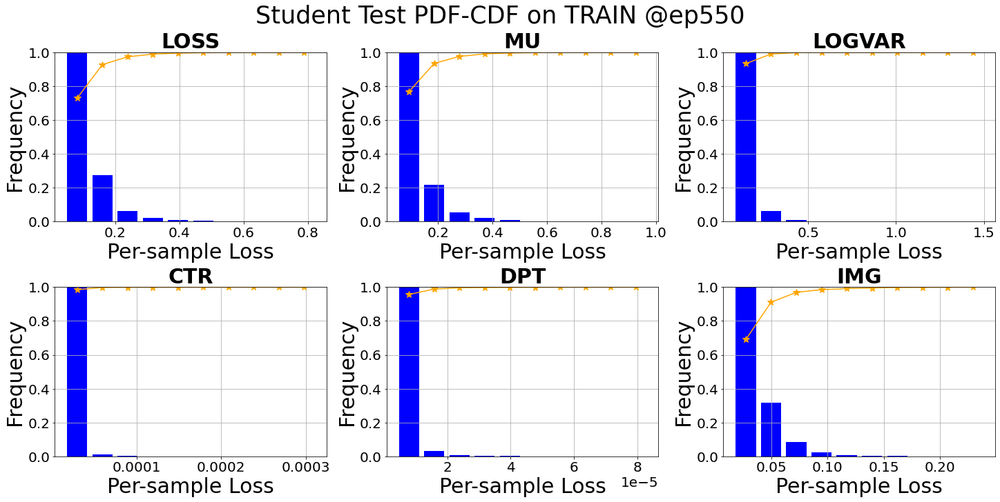

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1297.692524433136 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.0279    
Test finished. Average loss={'LOSS': 0.06687949828814123, 'MU': 0.06854642349392268, 'LOGVAR': 0.0480062915286772, 'CTR': 7.24091784271569e-06, 'DPT': 1.7170082542319995e-06, 'IMG': 0.025885568167628756}

Total training time: 91.01352715492249 sec


<Figure size 1440x720 with 0 Axes>

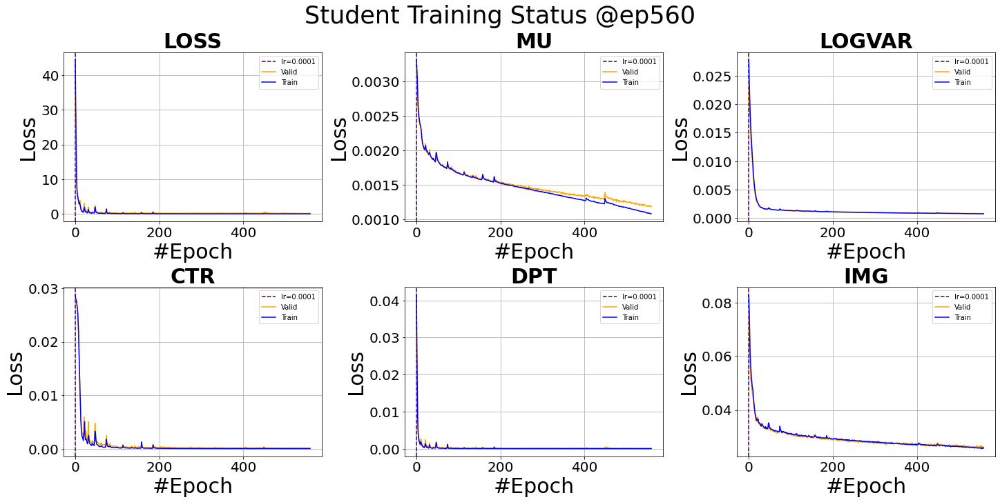

<Figure size 1440x720 with 0 Axes>

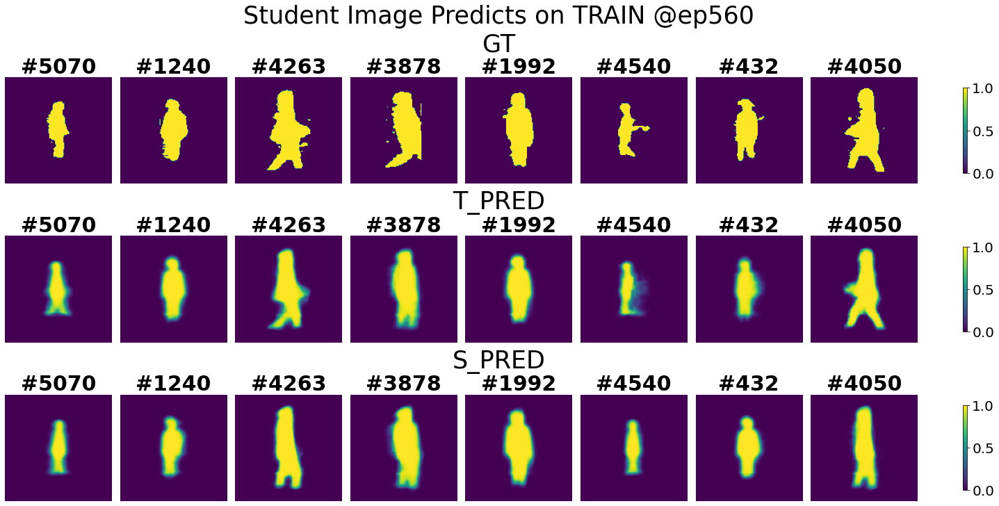

<Figure size 1440x720 with 0 Axes>

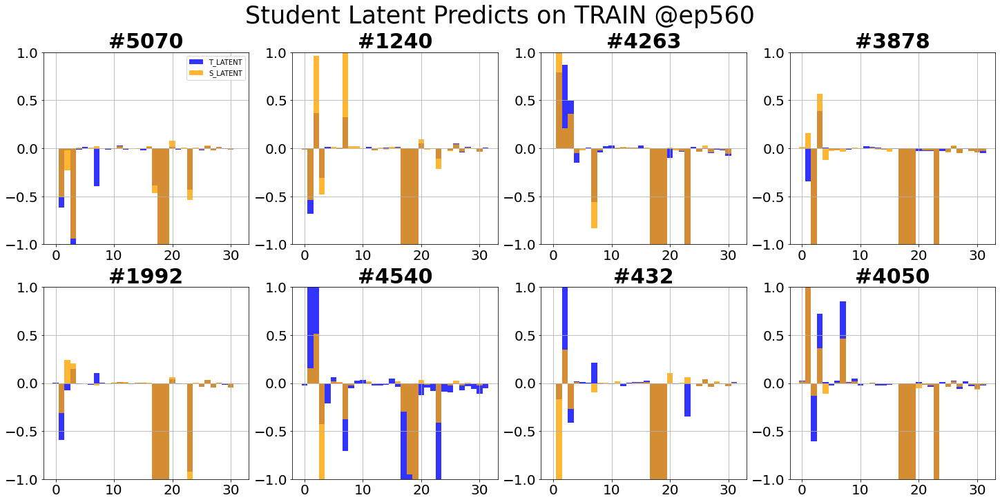

<Figure size 1440x720 with 0 Axes>

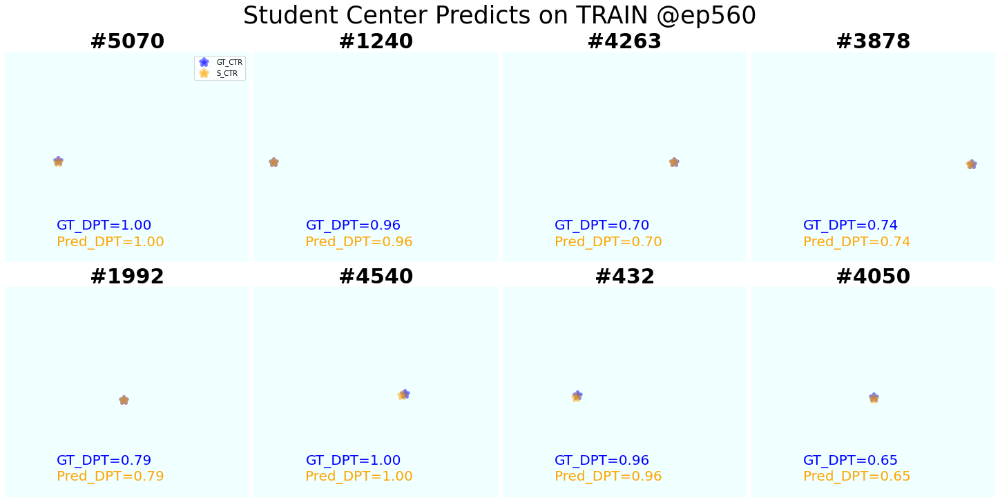

<Figure size 1440x720 with 0 Axes>

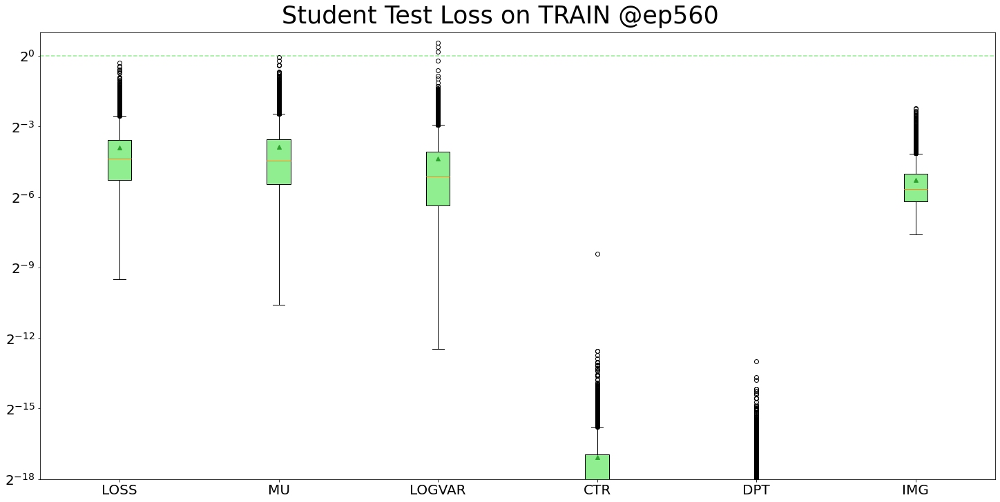

<Figure size 1440x720 with 0 Axes>

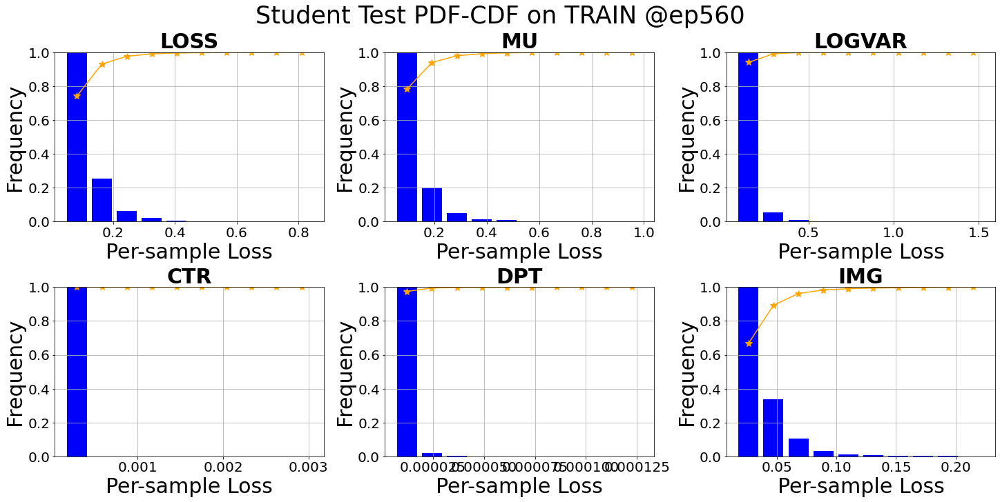

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1296.0249485969543 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.0307    
Test finished. Average loss={'LOSS': 0.06555392375766687, 'MU': 0.0675731522964766, 'LOGVAR': 0.04770828397060139, 'CTR': 5.514503035774946e-06, 'DPT': 1.402293677321914e-06, 'IMG': 0.02573534478529813}

Total training time: 91.3435709476471 sec


<Figure size 1440x720 with 0 Axes>

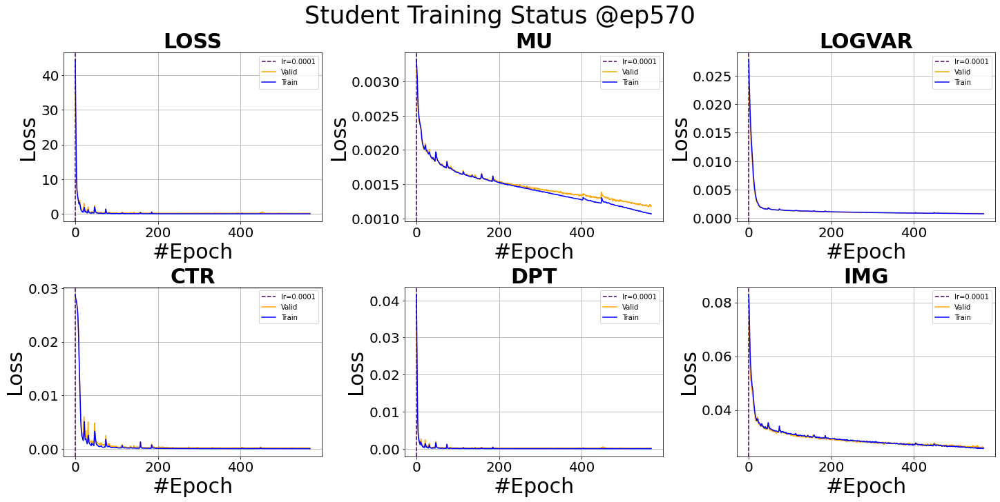

<Figure size 1440x720 with 0 Axes>

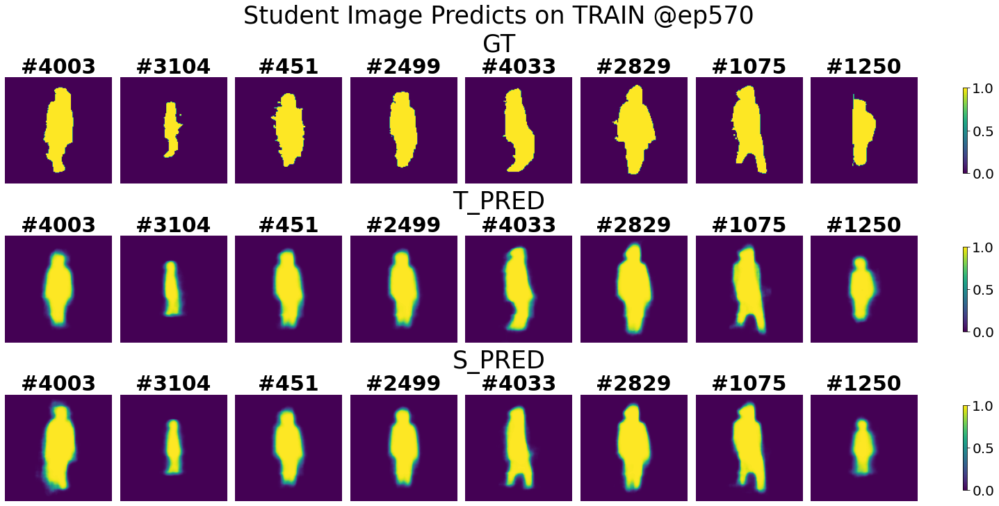

<Figure size 1440x720 with 0 Axes>

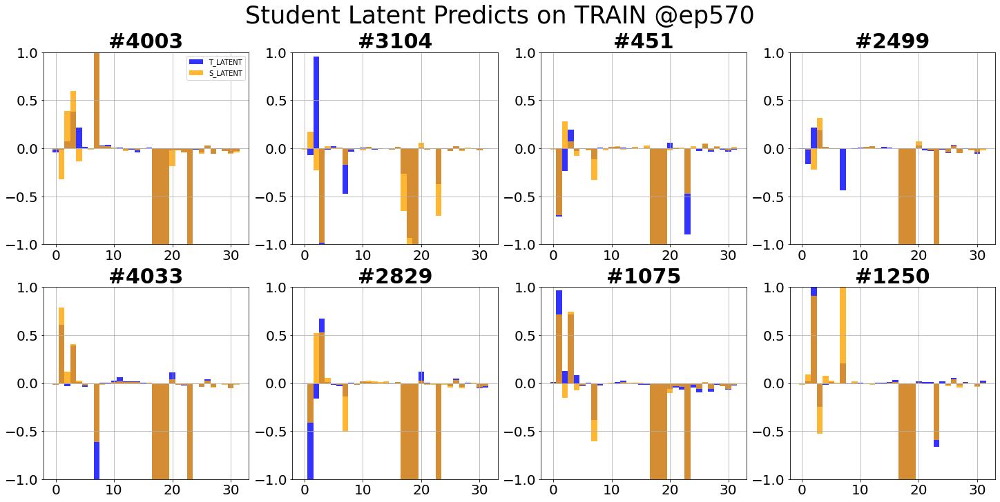

<Figure size 1440x720 with 0 Axes>

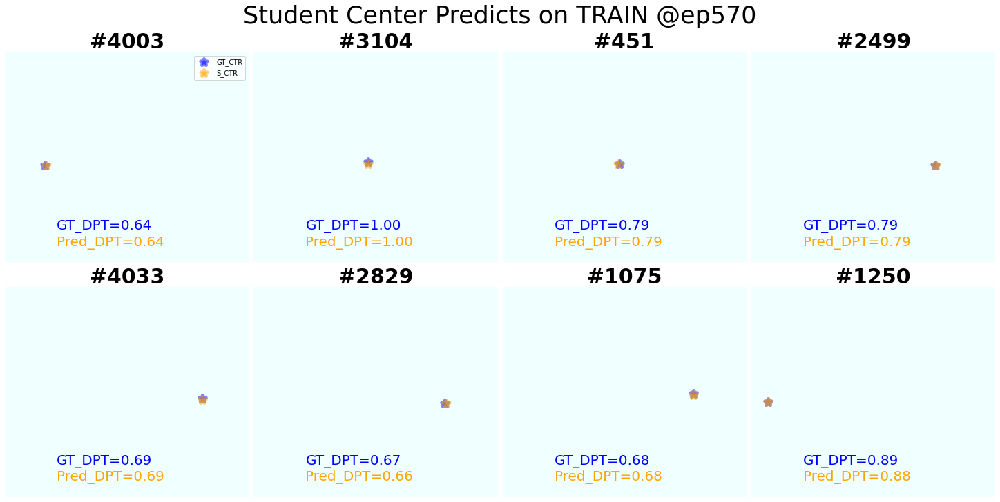

<Figure size 1440x720 with 0 Axes>

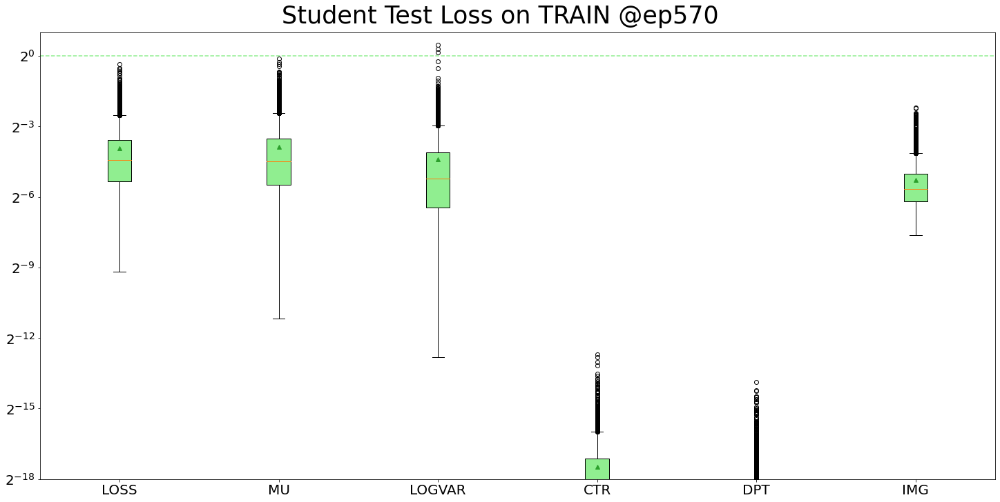

<Figure size 1440x720 with 0 Axes>

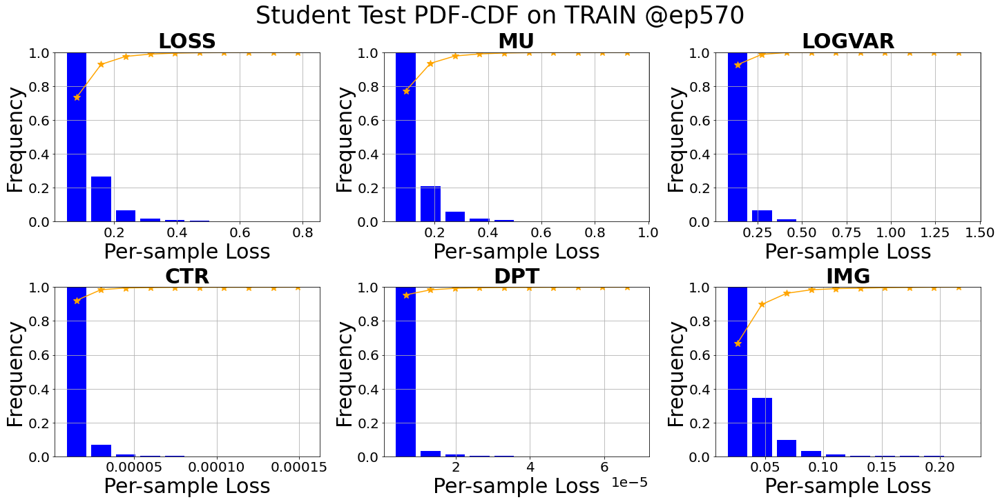

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1302.4749040603638 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.0921    
Test finished. Average loss={'LOSS': 0.06516855495940106, 'MU': 0.06674341685993568, 'LOGVAR': 0.047124630056401516, 'CTR': 4.605326964332763e-06, 'DPT': 1.8883616901387319e-06, 'IMG': 0.02539723624814341}

Total training time: 91.73737478256226 sec


<Figure size 1440x720 with 0 Axes>

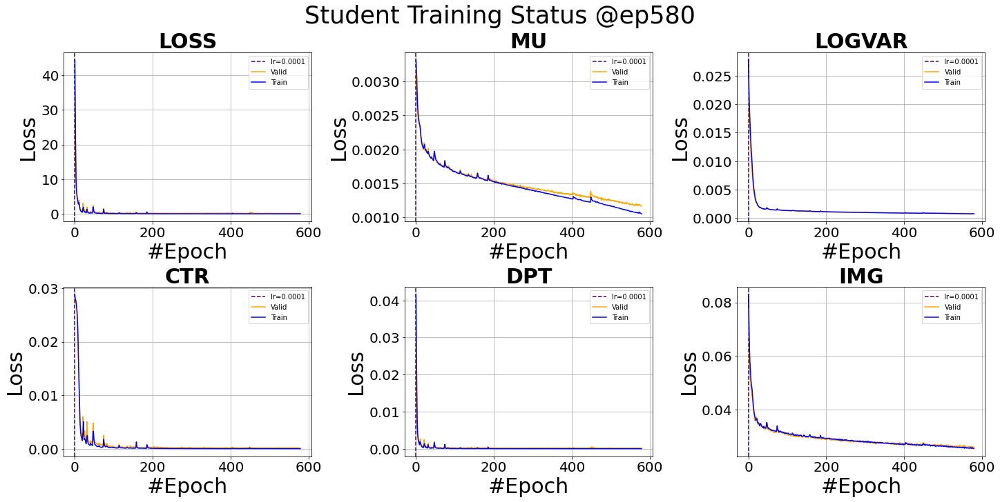

<Figure size 1440x720 with 0 Axes>

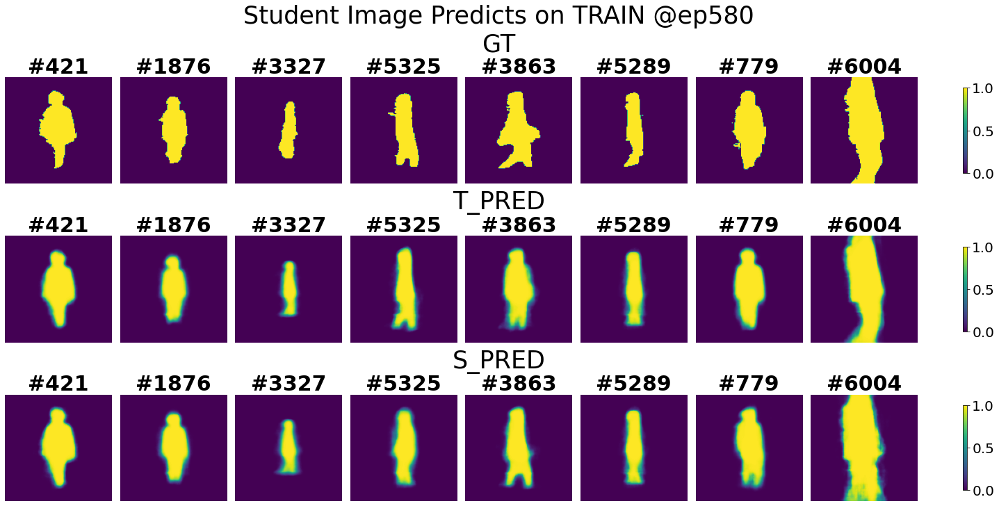

<Figure size 1440x720 with 0 Axes>

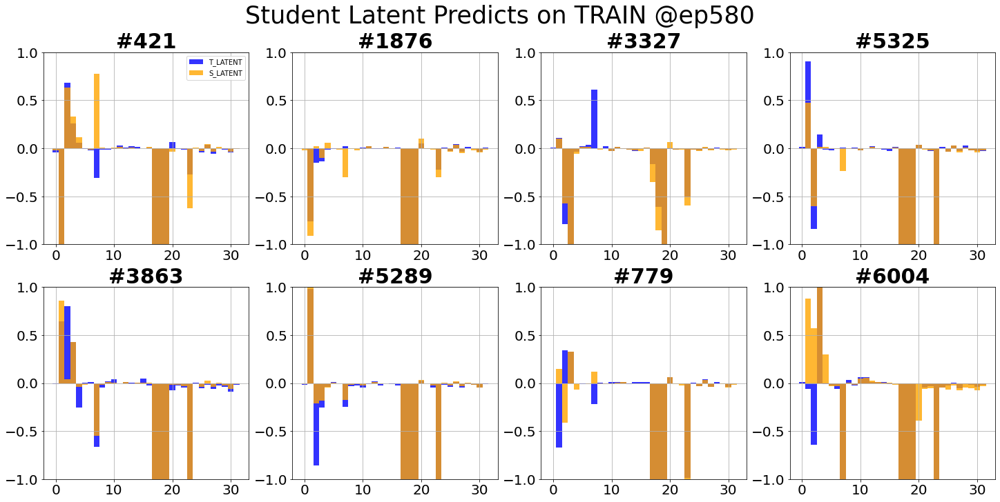

<Figure size 1440x720 with 0 Axes>

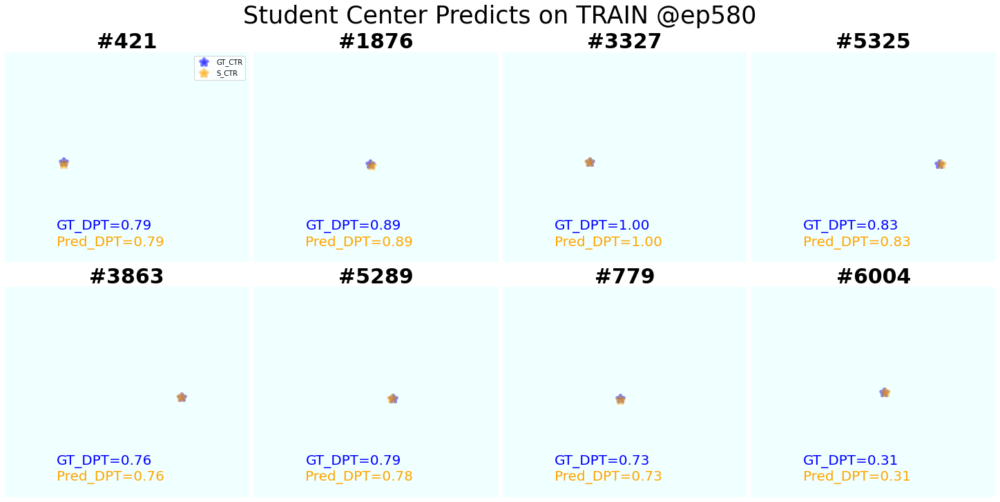

<Figure size 1440x720 with 0 Axes>

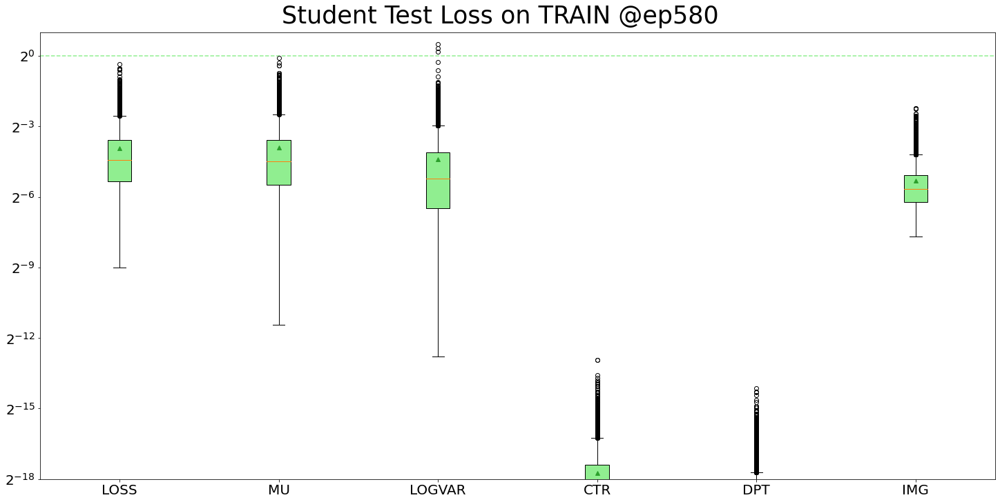

<Figure size 1440x720 with 0 Axes>

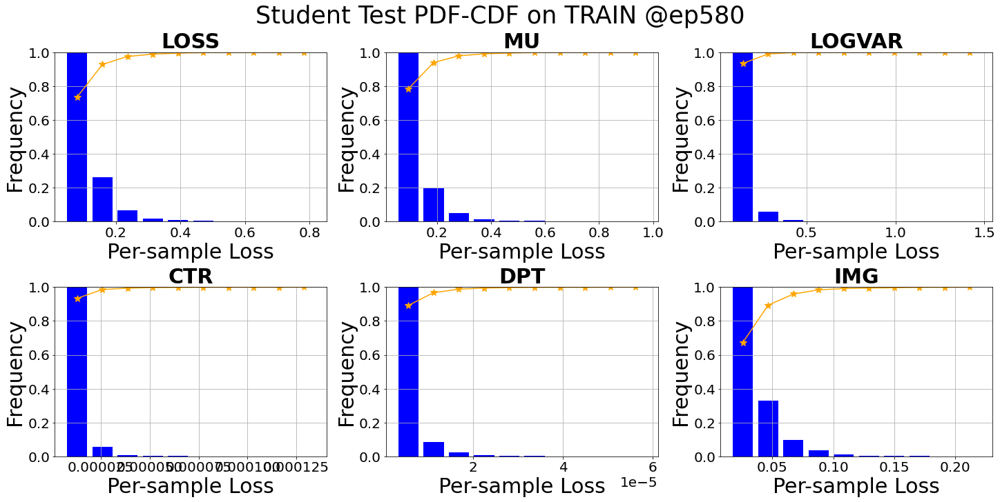

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1304.466766834259 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.0339    
Test finished. Average loss={'LOSS': 0.06502288484432041, 'MU': 0.06584394206257374, 'LOGVAR': 0.046960282148383124, 'CTR': 8.393648491887562e-06, 'DPT': 2.116308887549976e-06, 'IMG': 0.0254725529803772}

Total training time: 91.23751330375671 sec


<Figure size 1440x720 with 0 Axes>

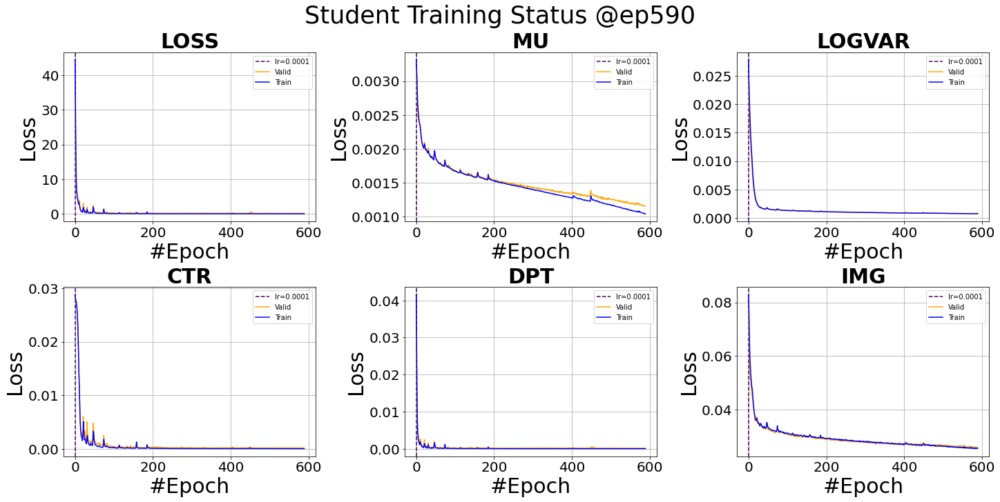

<Figure size 1440x720 with 0 Axes>

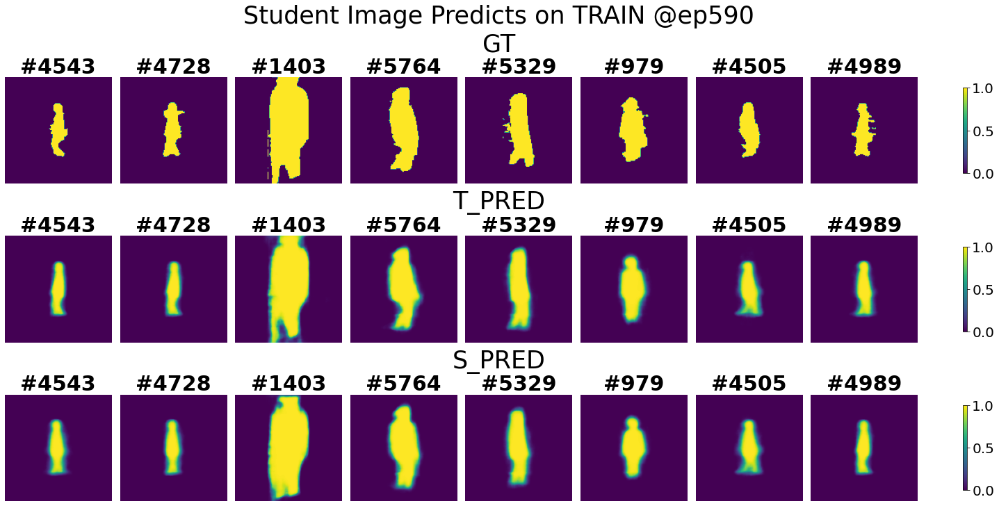

<Figure size 1440x720 with 0 Axes>

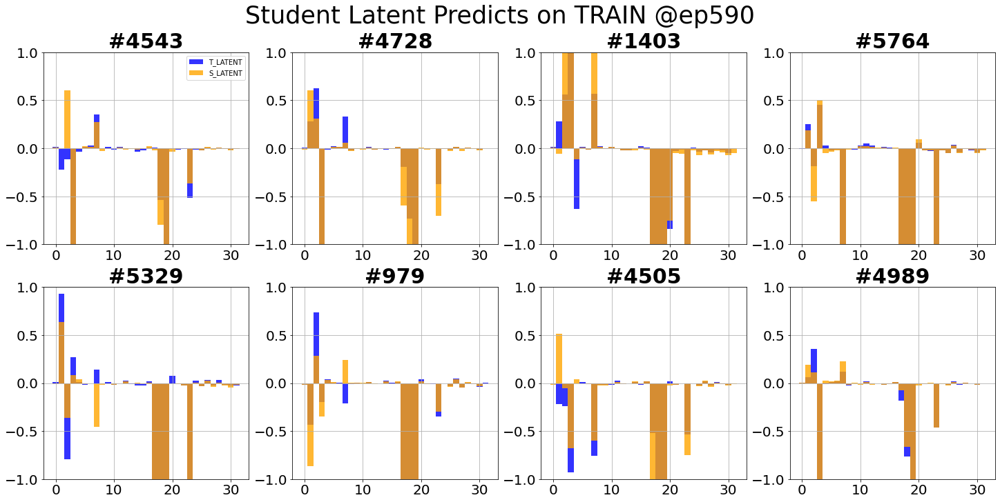

<Figure size 1440x720 with 0 Axes>

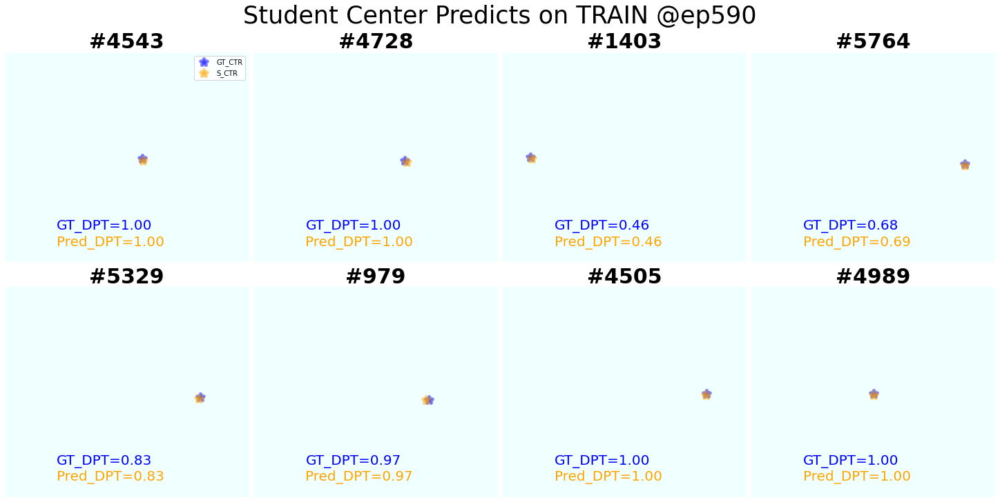

<Figure size 1440x720 with 0 Axes>

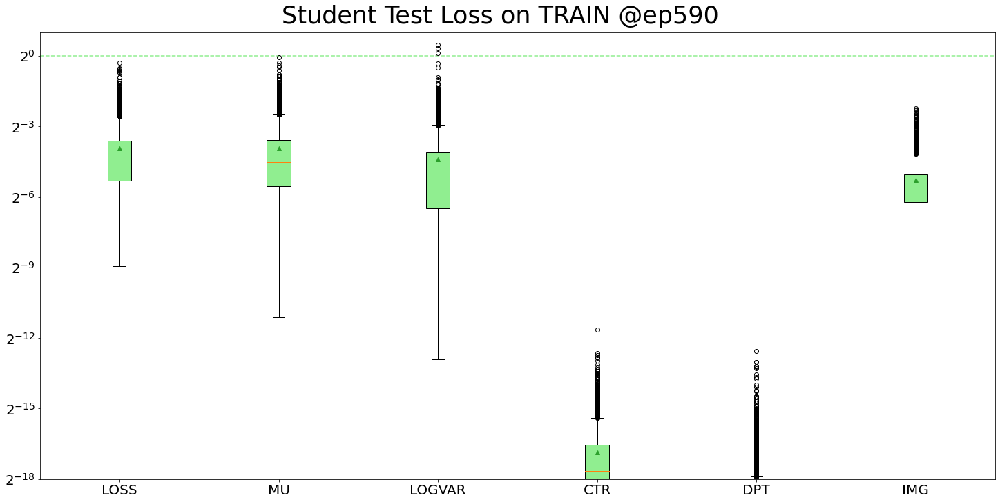

<Figure size 1440x720 with 0 Axes>

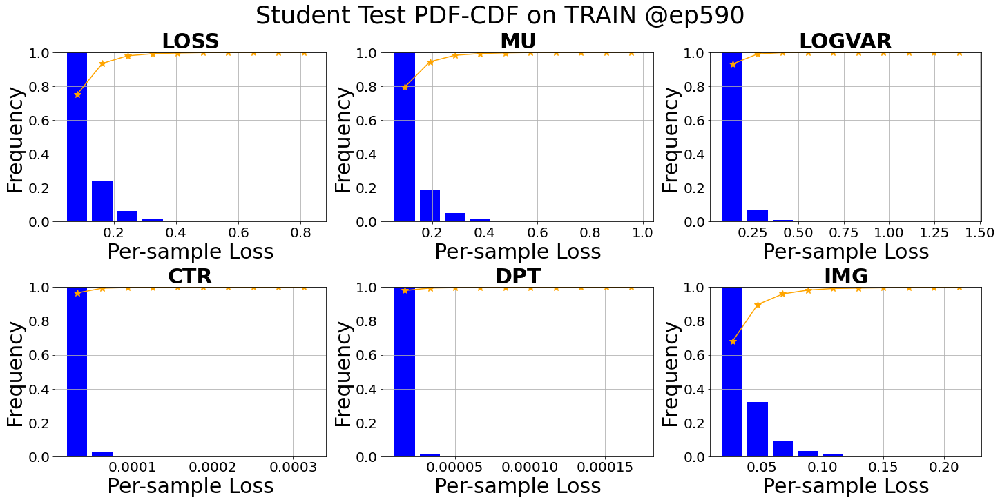

Student valid: epoch=9/10, batch=15/19, current best valid loss=0.0402        .0402    
Total training time: 1302.0917069911957 sec


/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=75/77, loss=0.1605    
Test finished. Average loss={'LOSS': 0.06300937448419039, 'MU': 0.06482686635984924, 'LOGVAR': 0.046086592329523335, 'CTR': 5.641868508215154e-06, 'DPT': 1.3663750204325767e-06, 'IMG': 0.02525271899796351}

Total training time: 91.19601392745972 sec


<Figure size 1440x720 with 0 Axes>

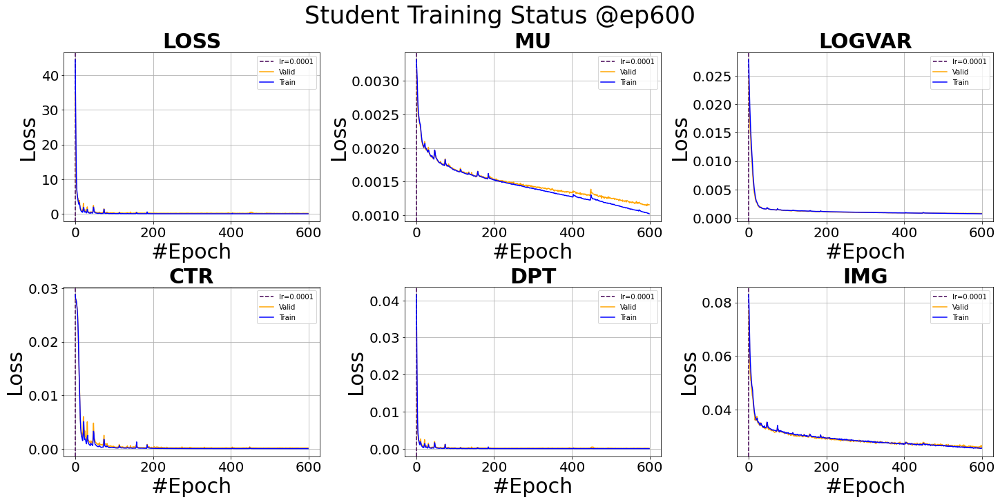

<Figure size 1440x720 with 0 Axes>

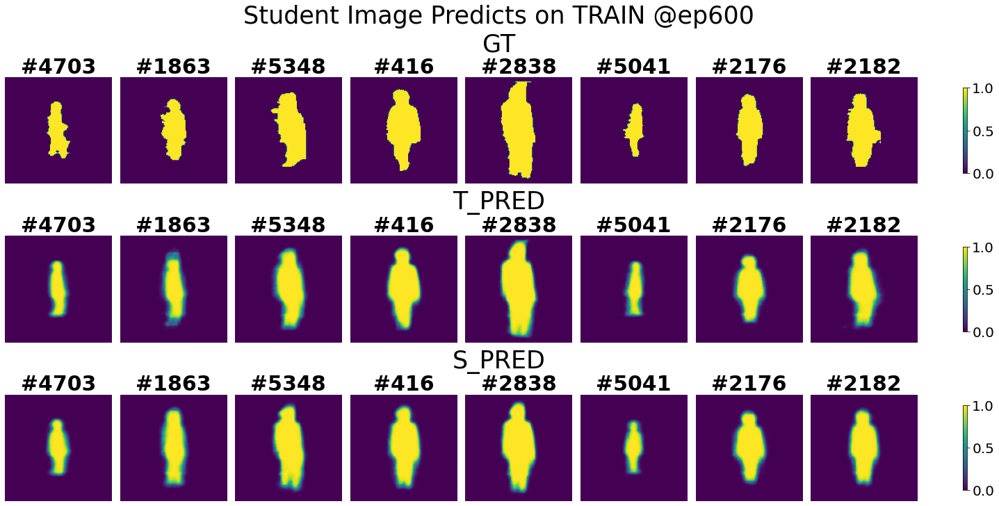

<Figure size 1440x720 with 0 Axes>

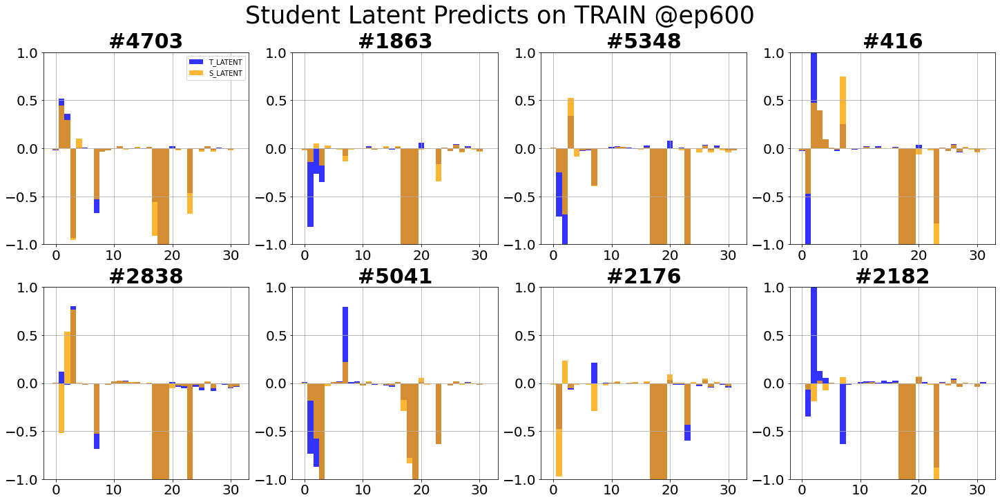

<Figure size 1440x720 with 0 Axes>

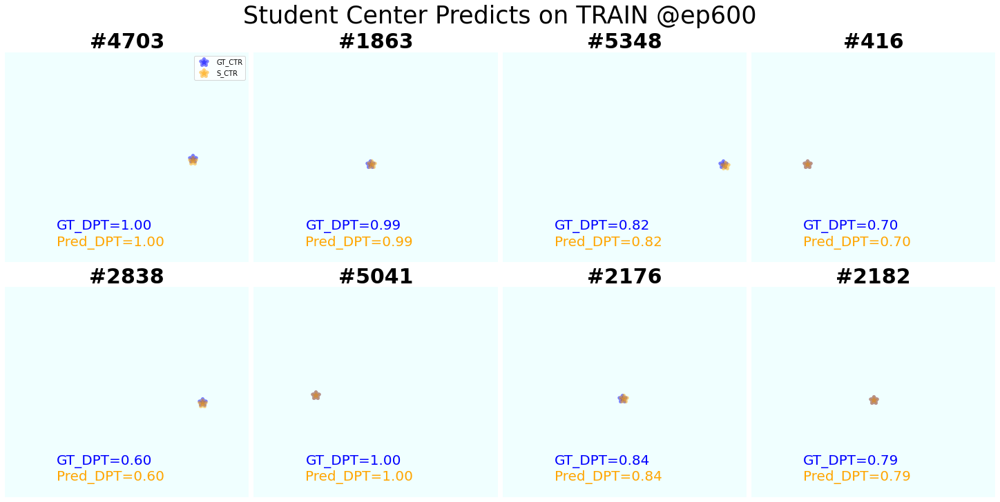

<Figure size 1440x720 with 0 Axes>

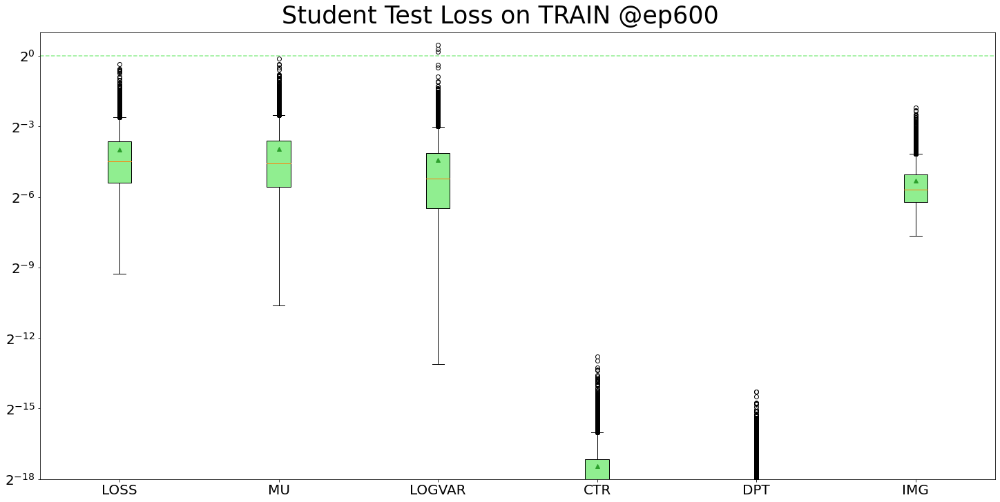

<Figure size 1440x720 with 0 Axes>

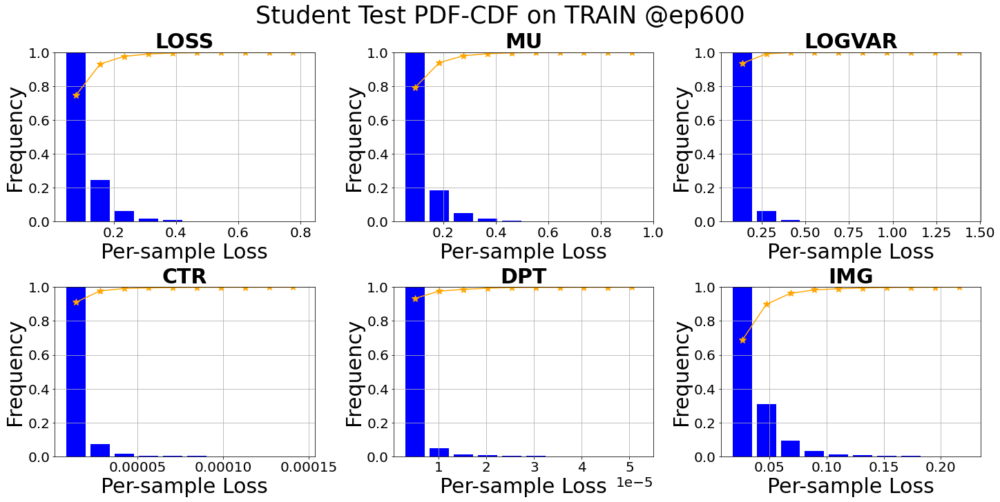


Schedule Completed!


In [16]:
### Scheduler
%matplotlib inline
#trainer1.lr=1e-5
S_trainer.scheduler(turns=10,
                  test_loader='train', select_num=8,
                  autosave=True, notion=f"{date}_{run}", train_module={'csien', 'ctrde'}, eval_module={'imgen', 'imgde'}, save_model=False)

/home/bob/.local/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py:172: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)
  return collate([torch.as_tensor(b) for b in batch], collate_fn_map=collate_fn_map)
/home/bob/.local/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py:172: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest 

Student test: sample=5/930, loss=85.5107    

/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([2])) that is different to the input size (torch.Size([1, 2])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=925/930, loss=0.0298      
Test finished. Average loss={'LOSS': 16.85316240812742, 'MU': 0.15230296858215844, 'LOGVAR': 0.20223475904537236, 'CTR': 0.007628778997720718, 'DPT': 0.01592799514875989, 'IMG': 0.036751657297273956}

Total training time: 22.70242190361023 sec


<Figure size 1440x720 with 0 Axes>

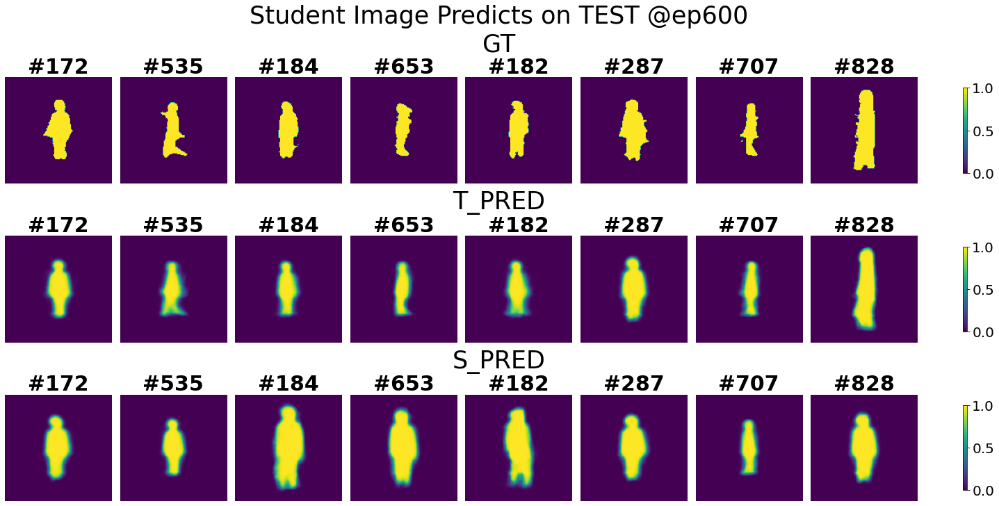

<Figure size 1440x720 with 0 Axes>

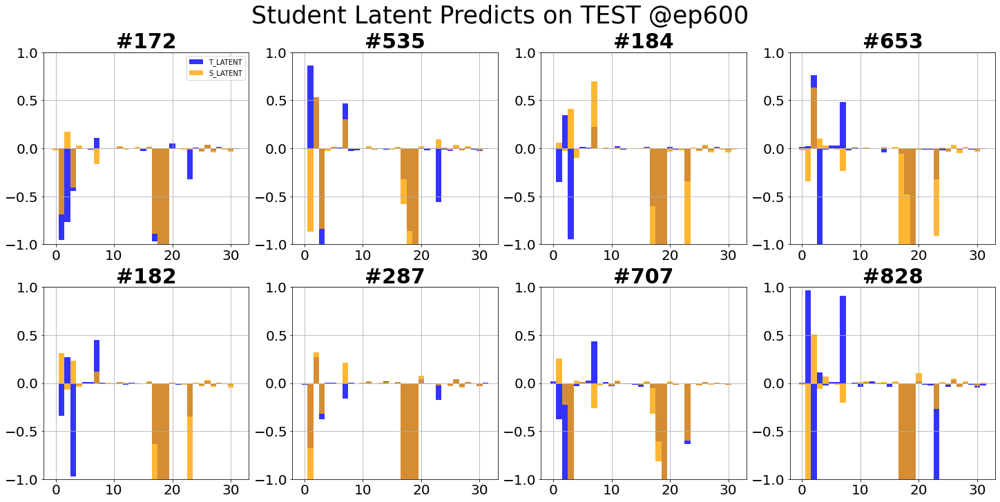

<Figure size 1440x720 with 0 Axes>

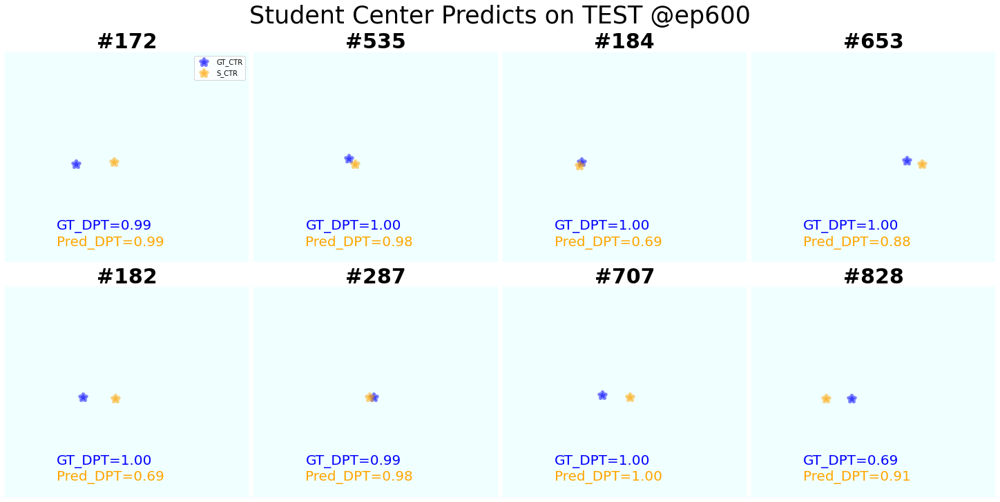

<Figure size 1440x720 with 0 Axes>

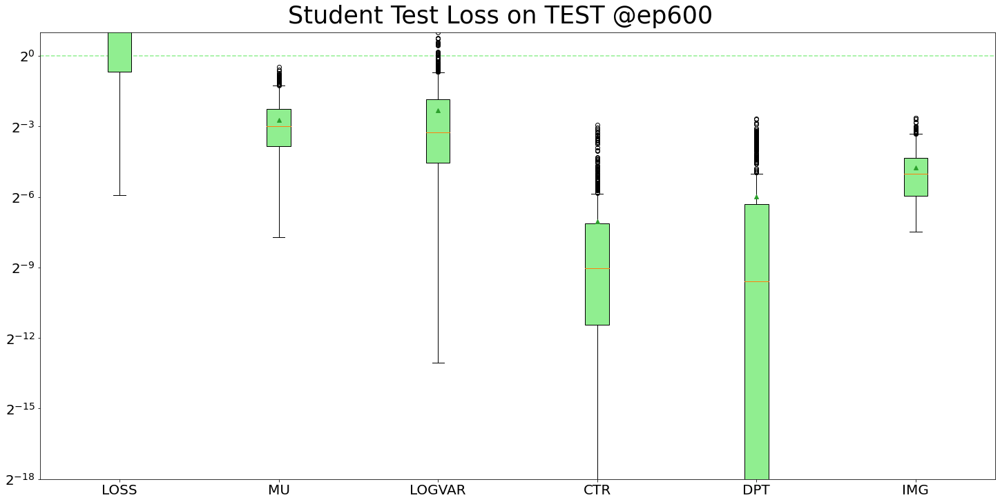

<Figure size 1440x720 with 0 Axes>

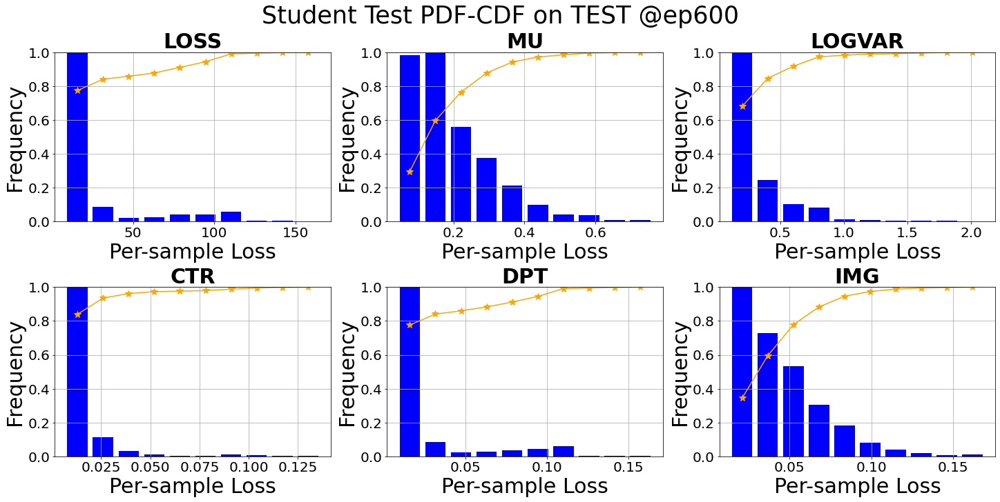

In [17]:
S_trainer.test(loader='test')
S_trainer.plot_test(select_num=8, autosave=True, notion=f"{date}_{run}")

In [ ]:
a=1

In [18]:
S_trainer.save(f"{date}_{run}")

Saving models...
Saving csien...
Saving ctrde...
Saving imgen...
Saving imgde...
All saved!


In [19]:
S_trainer.loss.save('pred', f"{date}_{run}")

Saving pred including GT, T_PRED, S_PRED, T_LATENT, S_LATENT, GT_CTR, S_CTR, GT_DPT, S_DPT, IND...Done


#### Test

/home/bob/datastore/Models/Trainer.py:191: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at ../aten/src/ATen/native/Copy.cpp:250.)
  data_[key] = value.to(torch.float32).to(self.device)
/home/bob/.local/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Student test: sample=15/17, loss=0.1052    
Test finished. Average loss={'LOSS': 0.0577851046802928, 'MU': 0.35868602988407744, 'LOGVAR': 0.17540513204082397, 'BBX': 0.5955600273343461, 'DPT': 0.029040615619575945, 'IMG': 0.07803787530129365}

Total training time: 9.84715747833252 sec


<Figure size 432x288 with 0 Axes>

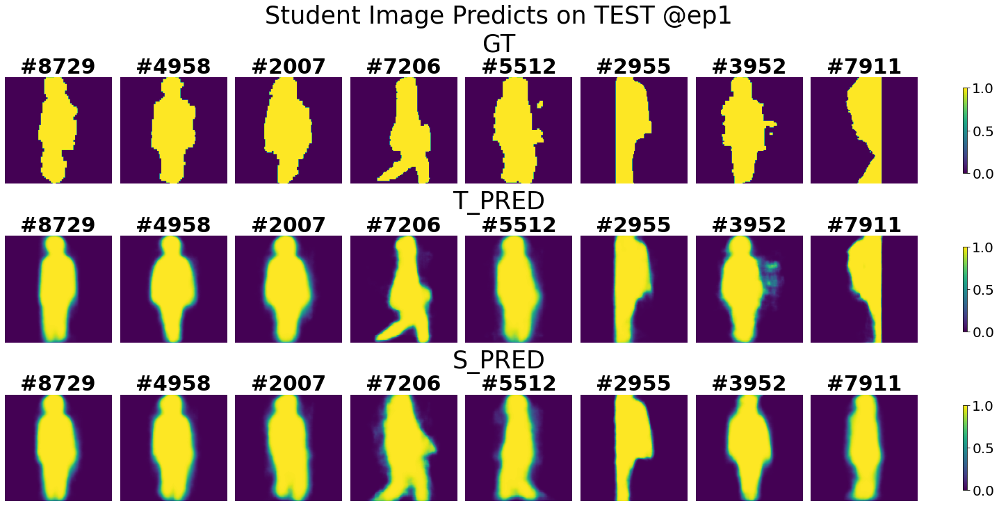

<Figure size 1440x720 with 0 Axes>

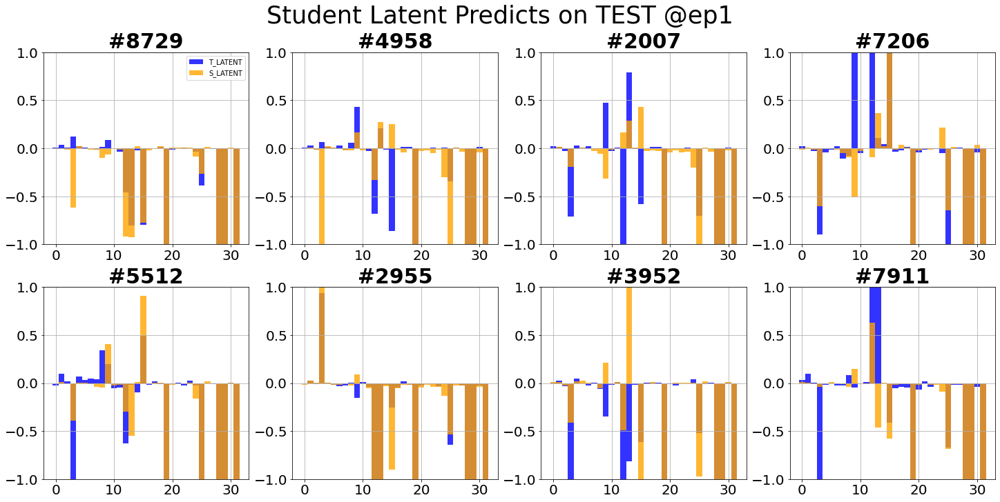

<Figure size 1440x720 with 0 Axes>

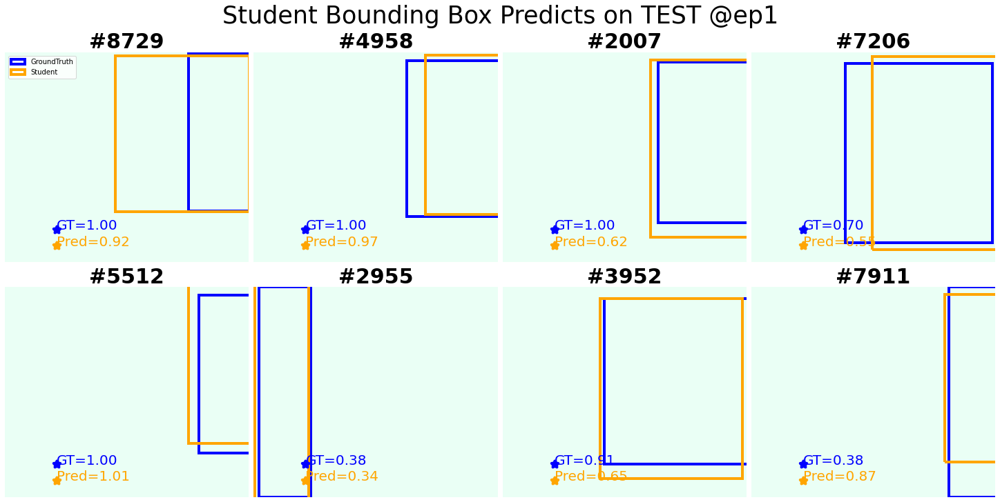

<Figure size 1440x720 with 0 Axes>

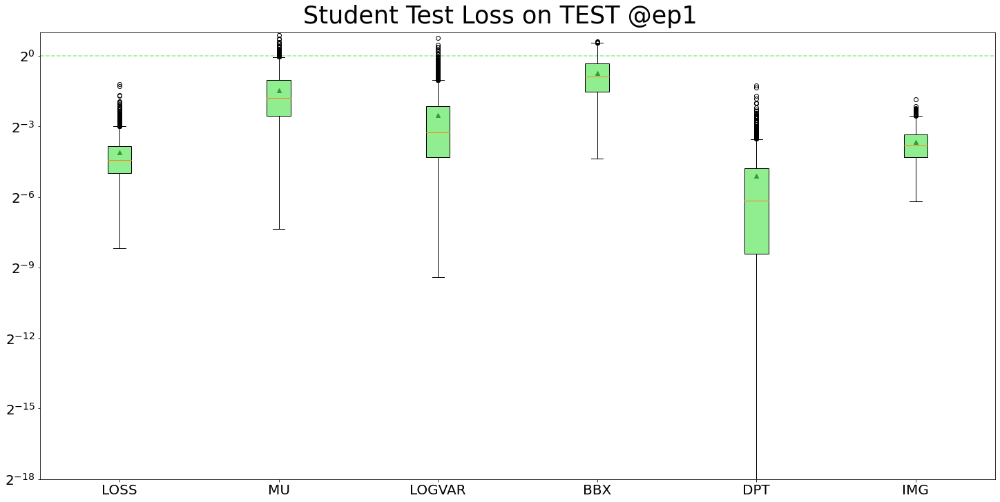

<Figure size 1440x720 with 0 Axes>

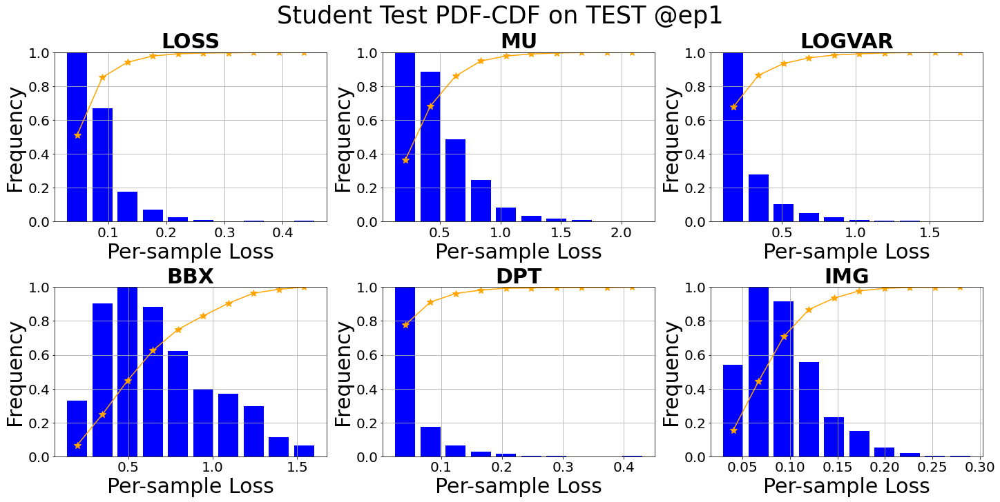

In [ ]:
torch.cuda.set_device(gpu)
csiencoder = TP.CSIEncoder()
bbxdecoder = TP.BBXDecoder()
imgencoder = TP.ImageEncoder(latent_dim=16)
imgdecoder = TP.ImageDecoder(latent_dim=16)

imgencoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_IMGENV06C2@ep200.pth"))
imgdecoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_IMGDEV06C2@ep200.pth"))
csiencoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_CSIENV06C2@ep200.pth"))
bbxdecoder.load_state_dict(torch.load(f"../saved/240320R2/240320R2_Student_BBXDEV06C2@ep200.pth"))

S_trainer = TP.StudentTrainer(
                              name='Student', mask=True,
    networks=[csiencoder, bbxdecoder, imgencoder, imgdecoder],
                 lr=1e-4, epochs=10, cuda=gpu,
                 train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader)

S_trainer.test(loader='test')
S_trainer.plot_test(select_num=8, autosave=True, notion=f"{date_run}_Comp")

In [ ]:
S_trainer.loss.save('pred', f"{date_run}_Comp")

Saving pred including GT T_PRED S_PRED T_LATENT S_LATENT GT_BBX S_BBX GT_DPT S_DPT IND...Done
